In [3]:
!dir

 E 드라이브의 볼륨: 새 볼륨
 볼륨 일련 번호: C450-6DD5

 E:\Dropbox\rPPG_Seongbeen 디렉터리

2021-05-20  오후 08:52    <DIR>          .
2021-05-20  오후 08:52    <DIR>          ..
2021-05-20  오후 08:52    <DIR>          .ipynb_checkpoints
2021-05-20  오후 03:33               463 default_test.cfg
2021-05-20  오후 08:52           370,846 PURE  적용.ipynb
               2개 파일             371,309 바이트
               3개 디렉터리  3,493,440,057,344 바이트 남음


지정된 경로를 찾을 수 없습니다.


## Load config file for paths, etc

In [1]:
import torch
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

import numpy as np
import configparser
import os
import json
import cv2
import matplotlib.pyplot as plt
from skimage import data, io, filters
from tqdm import tqdm


configFilename = 'PURE_PhysNet.cfg'

parser = configparser.ConfigParser(inline_comment_prefixes=('#', ';'))
parser.optionxform = str
parser.read(configFilename)

cfgdict = dict(parser['DEFAULT'].items())
vdir, sigdir = cfgdict['videodataDIR'], cfgdict['signalpath']
vdir, sigdir, cfgdict

('./Dataset/PURE/01-01/01-01',
 './Dataset/PURE/01-01/01-01.json',
 {'dataset': 'PURE',
  'model': 'PhysNet',
  'videodataDIR': './Dataset/PURE/01-01/01-01',
  'signalpath': './Dataset/PURE/01-01/01-01.json',
  'batch_size': '8',
  'learning_rate': '1e-3',
  'depth': '32',
  'height': '128',
  'width': '128',
  'crop': 'True'})

## sanity check 1: list video frame files

In [2]:
fl = os.listdir(vdir)
fl[0], len(fl), os.path.join(vdir,fl[0]), fl

('Image1392644048009507000.png',
 2026,
 './Dataset/PURE/01-01/01-01/Image1392644048009507000.png',
 ['Image1392644048009507000.png',
  'Image1392644034042847000.png',
  'Image1392644042442825000.png',
  'Image1392644036576166000.png',
  'Image1392643994676156000.png',
  'Image1392644022976172000.png',
  'Image1392644037042835000.png',
  'Image1392644038409497000.png',
  'Image1392644037276154000.png',
  'Image1392644040942847000.png',
  'Image1392644007742822000.png',
  'Image1392644051242845000.png',
  'Image1392644054842848000.png',
  'Image1392644008509499000.png',
  'Image1392644030409499000.png',
  'Image1392644052009491000.png',
  'Image1392644041776182000.png',
  'Image1392644044342845000.png',
  'Image1392644015776165000.png',
  'Image1392644019442827000.png',
  'Image1392644028876176000.png',
  'Image1392644045309497000.png',
  'Image1392644000709506000.png',
  'Image1392644000776164000.png',
  'Image1392644017742843000.png',
  'Image1392643995309485000.png',
  'Image13926440

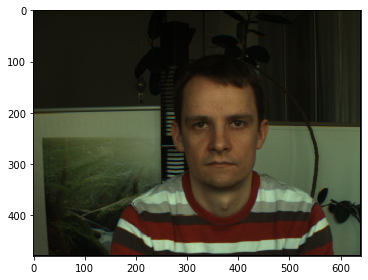

In [3]:
vfpath = os.path.join(vdir,fl[0])
img = io.imread(vfpath)
io.imshow(img)

## sanity check 2: review ppg signal data

In [4]:
with open(sigdir, "r") as st_json:
    data_json = json.load(st_json)

time_ns = list()
ppg = list()
for dat in data_json['/FullPackage']:
    time_ns.append(dat['Timestamp'])
    ppg.append(dat['Value']['waveform'])

time_ns = np.array(time_ns)
ppg = np.array(ppg)
ppg

array([48, 49, 49, ..., 41, 42, 41])

In [5]:
ppg.shape[0]/2, len(fl), min(int(ppg.shape[0]/2), len(fl))

(2009.0, 2026, 2009)

## sanity check : crop face

In [7]:
vfpath = os.path.join(vdir,fl[0])
img = io.imread(vfpath)

dpath = "haarcascade_frontalface_alt.xml"
if not os.path.exists(dpath):
    print("Cascade file not present!")
face_cascade = cv2.CascadeClassifier(dpath)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
detected = list(face_cascade.detectMultiScale(gray, 1.1, 4))

if len(detected) > 0:
    detected.sort(key=lambda a: a[-1] * a[-2])
    face_rect = detected[-1]
x, y, w, h = face_rect

for fn in fl[:1600:200]:
    vfpath = os.path.join(vdir,fn)
    img = io.imread(vfpath)

    img_crop = img[y:y + h, x: x + w, :]
#     plt.imshow(img_crop)
#     plt.show()

    cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 0), 2)
#     plt.imshow(img)
#     plt.show()
    img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    cv2.imshow('img', img_bgr)
    cv2.waitKey(0)
cv2.destroyAllWindows()

In [8]:
img_crop.shape

(185, 185, 3)

### sanity check : load image in pytorch tensor

In [9]:
from torchvision.transforms import RandomRotation, ToPILImage, ToTensor, ColorJitter

test = ToTensor()(img)
test.shape

torch.Size([3, 480, 640])

In [10]:
img.shape

(480, 640, 3)

In [11]:
img[:2,:2,:2], test[:2,:2,:2]

(array([[[24, 25],
         [26, 26]],
 
        [[27, 24],
         [26, 25]]], dtype=uint8),
 tensor([[[0.0941, 0.1020],
          [0.1059, 0.1020]],
 
         [[0.0980, 0.1020],
          [0.0941, 0.0980]]]))

## pytorch Dataset and Data loader (also set device)

In [188]:
from torchvision.transforms import RandomRotation, ToPILImage, ToTensor, ColorJitter

"""
PyTorch Dataset classes for dataloader
"""

class DatasetPhysNetED(Dataset):
    """
        Dataset class for PhysNet neural network.
    """
    def __init__(self, cfgdict, start = 0, end = None, overlap= 0.5):

        # Load video image list
        self.vdir = cfgdict['videodataDIR']
        vfl = os.listdir(vdir)
                
        if end == None:
            end = len(vfl)
        self.vfl = vfl[start:end]
        
        # Load PPG signals
        self.sigdir = cfgdict['signalpath']
        with open(self.sigdir, "r") as st_json:
            data_json = json.load(st_json)
        time_ns = list()
        ppg = list()
        for dat in data_json['/FullPackage']:
            time_ns.append(dat['Timestamp'])
            ppg.append(dat['Value']['waveform'])
        self.time_ns = np.array(time_ns)
        self.ppg = np.array(ppg)[start*2:end*2:2]
                
        self.depth = int(cfgdict['depth'])
        self.height = int(cfgdict['height'])
        self.width = int(cfgdict['width'])
        self.channel = 3

        self.shift = int(self.depth*(1-overlap))  # overlap, s.t., 0=< overlap < 1
        self.num_samples = (end - start - self.depth)//self.shift+1

        self.crop = bool(cfgdict['crop'])
#         if self.crop:        
        # Crop Face Rectangle - from 1st image
        vfpath = os.path.join(vdir,vfl[0])
        img = io.imread(vfpath)

        dpath = "haarcascade_frontalface_alt.xml"
        if not os.path.exists(dpath):
            print("Cascade file not present!")
        face_cascade = cv2.CascadeClassifier(dpath)

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        detected = list(face_cascade.detectMultiScale(gray, 1.1, 4))

        if len(detected) > 0:
            detected.sort(key=lambda a: a[-1] * a[-2])
            face_rect = detected[-1]
        self.face_rect = face_rect
#         x, y, w, h = face_rect

    def __len__(self):
        return self.num_samples # min(int(ppg.shape[0]/2), len(fl)-1)
    
    def __getitem__(self, idx):
        # -------------------------------
        # Fill video with frames
        # -------------------------------
        # conv3d input: N x C x D x H X W
        x, y, w, h = self.face_rect
        
        shift = self.shift
        depth = self.depth
        height = self.height
        width = self.width
        channel = self.channel
        # vfl = self.vfl
        # ppg = self.ppg
        vdir = self.vdir
            
        video = torch.empty(channel, depth, height, width, dtype=torch.float)
        for cnt, fn in enumerate(self.vfl[idx * shift : idx*shift + depth ]):
            vfpath = os.path.join(vdir,fn)
            img = io.imread(vfpath)
            if self.crop:        
                img = img[y:y + h, x: x + w, :]
            img = cv2.resize(img, (height, width), interpolation=cv2.INTER_CUBIC)
            img = ToTensor()(img)
            img = torch.sub(img, torch.mean(img, (1, 2)).view(3, 1, 1))  # spatial intensity norm for each channel

            video[:, cnt, :, :] = img  # video -> C, D, H, W
                         
            # Swap axes because  numpy image: H x W x C | torch image: C X H X W
#             img = torch.from_numpy(img.astype(np.float32))
#             img = img.permute(2, 0, 1)
#             img =/ 255. # convert image to [0, 1]
#                     img = tr.sub(img, tr.mean(img, (1, 2)).view(3, 1, 1))  # Color channel centralization
        target = self.ppg[idx * shift : idx*shift + depth]
        target = torch.tensor(target, dtype=torch.float)
        return video, target

overlap = 0.25
batch_size = 32

trainset = DatasetPhysNetED(cfgdict, start = 0, end = 1600, overlap = overlap)
testset = DatasetPhysNetED(cfgdict, start = 1601, end = 2009, overlap = 0)

# Construct DataLoaders
trainloader = DataLoader(trainset,
                         batch_size = batch_size)
testloader = DataLoader(testset,
                         batch_size = batch_size)

# Get cpu or gpu device for training.
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using {} device".format(device))

Using cuda device


In [13]:
torch.cuda.is_available()

True

## sanity check 3: dataset and data loader

tensor([59., 67., 67., 62., 54., 47., 43., 43., 44., 45., 44., 42., 40., 37.,
        34., 32., 30., 28., 27., 26., 28., 36., 50., 64., 71., 69., 63., 56.,
        51., 48., 48., 49.])


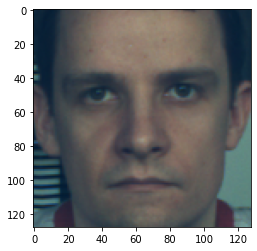

torch.Size([3, 32, 128, 128]) torch.Size([3, 128, 128]) torch.Size([128, 128, 3])


(tensor(0.3039), tensor(-0.3392))

In [14]:
video, target = trainset.__getitem__(2)
print(target)

img = video[:,0,:,:]

plt.imshow(img.permute(1, 2, 0)-img.min())
plt.show()

print(video.shape, img.shape, img.permute(1, 2, 0).shape)
img.max(), img.min()

In [15]:
for inputs, targets in trainloader:
    break

len(inputs), inputs.shape, targets.shape

(8, torch.Size([8, 3, 32, 128, 128]), torch.Size([8, 32]))

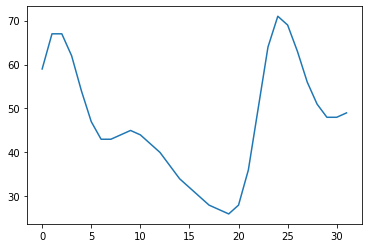

In [16]:
plt.plot(target)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


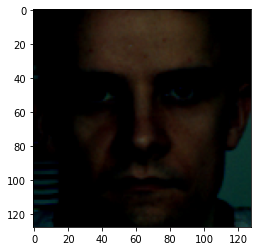

In [17]:
img_o = img.permute(1, 2, 0)
img_o = img_o.cpu().detach().numpy()
plt.imshow(img_o)

## PhysNet Model

In [19]:
"""
This module contains the used architectures for pulse signal and pulse rate extracton
"""
import torch
import torch.nn as nn

# -------------------------------------------------------------------------------------------------------------------
# PhyNet network
# -------------------------------------------------------------------------------------------------------------------

class PhysNetED(nn.Module):
    def __init__(self):
        super().__init__()

        self.start = nn.Sequential(
            nn.Conv3d(in_channels=3, out_channels=32, kernel_size=(1, 5, 5), stride=1, padding=(0, 2, 2)),
            nn.BatchNorm3d(32),
            nn.ELU()
        )

        # 1x
        self.loop1 = nn.Sequential(
            nn.AvgPool3d(kernel_size=(1, 2, 2), stride=(1, 2, 2), padding=0),
            nn.Conv3d(in_channels=32, out_channels=64, kernel_size=(3, 3, 3), stride=1, padding=(1, 1, 1)),
            nn.BatchNorm3d(64),
            nn.ELU(),
            nn.Conv3d(in_channels=64, out_channels=64, kernel_size=(3, 3, 3), stride=1, padding=(1, 1, 1)),
            nn.BatchNorm3d(64),
            nn.ELU()
        )

        # encoder
        self.encoder = nn.Sequential(
            nn.AvgPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2), padding=0),
            nn.Conv3d(in_channels=64, out_channels=64, kernel_size=(3, 3, 3), stride=1, padding=(1, 1, 1)),
            nn.BatchNorm3d(64),
            nn.ELU(),
            nn.Conv3d(in_channels=64, out_channels=64, kernel_size=(3, 3, 3), stride=1, padding=(1, 1, 1)),
            nn.BatchNorm3d(64),
            nn.ELU(),

            nn.AvgPool3d(kernel_size=(2, 2, 2), stride=(2, 2, 2), padding=0),
            nn.Conv3d(in_channels=64, out_channels=64, kernel_size=(3, 3, 3), stride=1, padding=(1, 1, 1)),
            nn.BatchNorm3d(64),
            nn.ELU(),
            nn.Conv3d(in_channels=64, out_channels=64, kernel_size=(3, 3, 3), stride=1, padding=(1, 1, 1)),
            nn.BatchNorm3d(64),
            nn.ELU()
        )

        #
        self.loop4 = nn.Sequential(
            nn.AvgPool3d(kernel_size=(1, 2, 2), stride=(1, 2, 2), padding=0),
            nn.Conv3d(in_channels=64, out_channels=64, kernel_size=(3, 3, 3), stride=1, padding=(1, 1, 1)),
            nn.BatchNorm3d(64),
            nn.ELU(),
            nn.Conv3d(in_channels=64, out_channels=64, kernel_size=(3, 3, 3), stride=1, padding=(1, 1, 1)),
            nn.BatchNorm3d(64),
            nn.ELU()
        )

        # decoder to reach back initial temporal length
        self.decoder = nn.Sequential(
            nn.ConvTranspose3d(in_channels=64, out_channels=64, kernel_size=(4, 1, 1), stride=(2, 1, 1),
                               padding=(1, 0, 0)),
            nn.BatchNorm3d(64),
            nn.ELU(),

            nn.ConvTranspose3d(in_channels=64, out_channels=64, kernel_size=(4, 1, 1), stride=(2, 1, 1),
                               padding=(1, 0, 0)),
            nn.BatchNorm3d(64),
            nn.ELU()
        )

        self.end = nn.Sequential(
            nn.AdaptiveAvgPool3d((None, 1, 1)),
            nn.Conv3d(in_channels=64, out_channels=1, kernel_size=(1, 1, 1), stride=1, padding=(0, 0, 0))
        )

    def forward(self, x):
        x = self.start(x)
        x = self.loop1(x)
        x = self.encoder(x)
        x = self.loop4(x)
        x = self.decoder(x)
        x = self.end(x)

        return x
    
model = PhysNetED()
if device != 'cpu':
    model = model.cuda()
loss_fn = nn.MSELoss()
learning_rate = float(cfgdict['learning_rate'])
optimizer =  torch.optim.AdamW(model.parameters(), lr=learning_rate)

## sanity check 4 : train 2 batchs

In [20]:
device

'cuda'

In [21]:
model.train()
size = len(trainloader.dataset)
for batch, (inputs, targets) in enumerate(trainloader):
    if batch <=1: 
        inputs = inputs.to(device)
        targets = targets.to(device)

        # Compute prediction error
        pred = model(inputs)
        loss = loss_fn(pred, targets)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss, current = loss.item(), batch * len(targets)
        print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")
    else:
        break
        
pred, targets, torch.tensor(targets, dtype=torch.float)

/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/torch/nn/modules/loss.py:528: UserWarning: Using a target size (torch.Size([8, 32])) that is different to the input size (torch.Size([8, 1, 32, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


loss: 1967.565674  [    0/   49]
loss: 1791.527344  [    8/   49]


/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/ipykernel_launcher.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


(tensor([[[[[ 0.0095]],
 
           [[-0.1457]],
 
           [[-0.0971]],
 
           [[-0.1765]],
 
           [[-0.1661]],
 
           [[-0.2280]],
 
           [[-0.1587]],
 
           [[-0.4355]],
 
           [[-0.2195]],
 
           [[-0.4130]],
 
           [[-0.2131]],
 
           [[-0.4354]],
 
           [[-0.2541]],
 
           [[-0.4863]],
 
           [[-0.2711]],
 
           [[-0.4094]],
 
           [[-0.2406]],
 
           [[-0.5437]],
 
           [[-0.2169]],
 
           [[-0.4111]],
 
           [[-0.2735]],
 
           [[-0.4909]],
 
           [[-0.1602]],
 
           [[-0.2691]],
 
           [[-0.2254]],
 
           [[-0.3601]],
 
           [[-0.1152]],
 
           [[ 0.0078]],
 
           [[-0.1330]],
 
           [[-0.1493]],
 
           [[ 0.0144]],
 
           [[ 0.1019]]]],
 
 
 
         [[[[ 0.0106]],
 
           [[-0.1398]],
 
           [[-0.0899]],
 
           [[-0.1592]],
 
           [[-0.1560]],
 
           [[-0.2258]],
 
      

## train

Epoch 8
-------------------------------
loss: 26.945805  [    0/   66]
loss: 40.491573  [   32/   66]
loss: 21.181414  [    4/   66]
Test loss: 606.641968 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


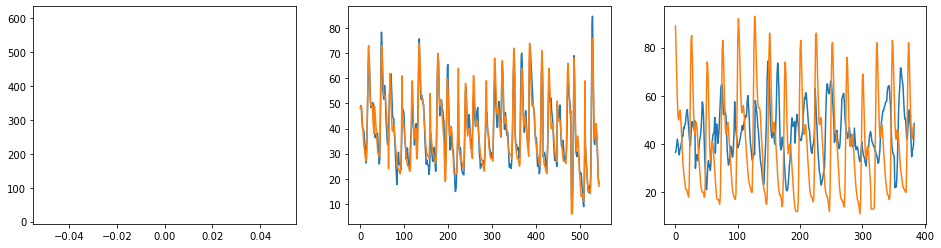

Epoch 8
-------------------------------
loss: 31.832237  [    0/   66]
loss: 48.983963  [   32/   66]
loss: 49.732616  [    4/   66]
Test loss: 596.746399 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


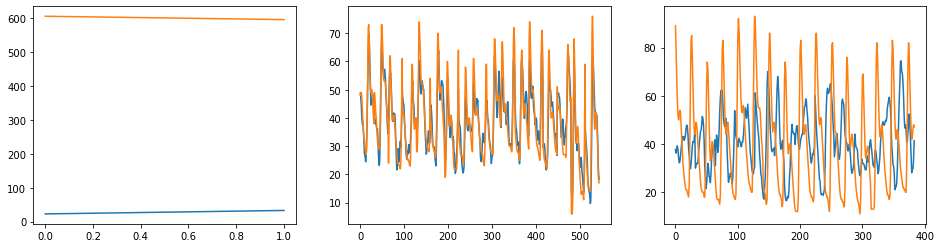

Epoch 8
-------------------------------
loss: 25.445942  [    0/   66]
loss: 47.804756  [   32/   66]
loss: 48.583954  [    4/   66]
Test loss: 592.742737 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


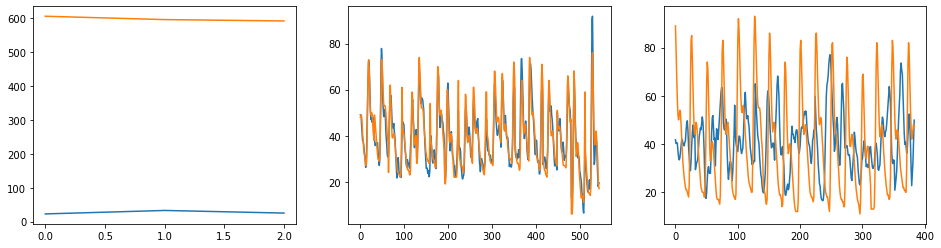

Epoch 8
-------------------------------
loss: 28.359177  [    0/   66]
loss: 45.119804  [   32/   66]
loss: 9.972466  [    4/   66]
Test loss: 659.125793 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


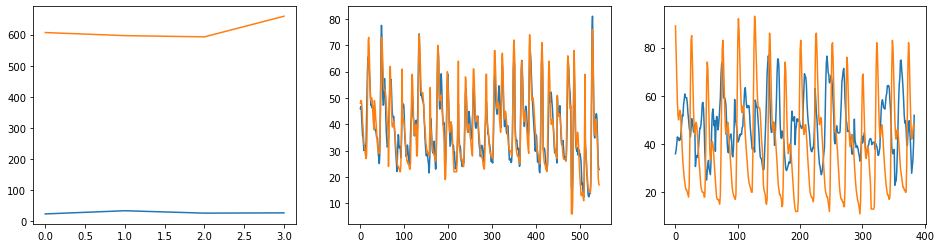

Epoch 8
-------------------------------
loss: 31.792171  [    0/   66]
loss: 46.669258  [   32/   66]
loss: 10.668463  [    4/   66]
Test loss: 665.853882 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


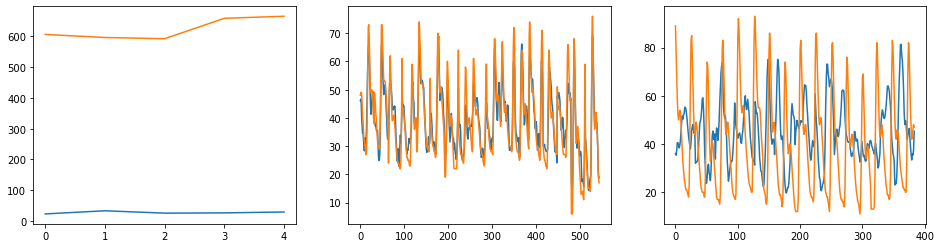

Epoch 8
-------------------------------
loss: 26.058201  [    0/   66]
loss: 38.789150  [   32/   66]
loss: 6.394754  [    4/   66]
Test loss: 654.127197 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


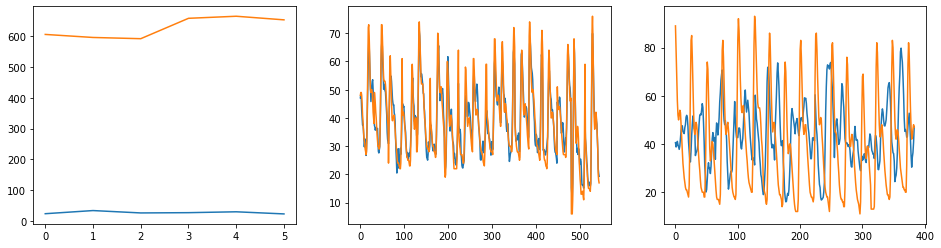

Epoch 8
-------------------------------
loss: 23.810555  [    0/   66]
loss: 36.940384  [   32/   66]
loss: 5.736518  [    4/   66]
Test loss: 654.679016 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


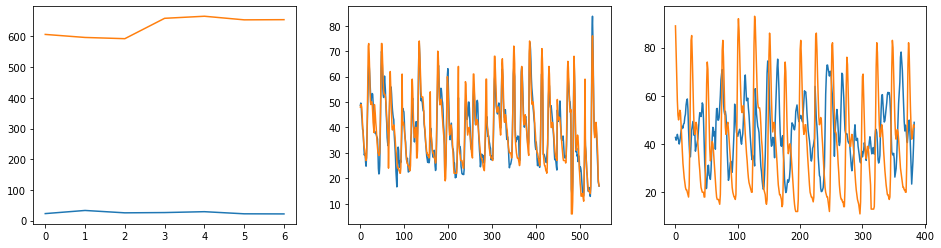

Epoch 8
-------------------------------
loss: 22.191269  [    0/   66]
loss: 33.906952  [   32/   66]
loss: 5.058487  [    4/   66]
Test loss: 603.449646 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


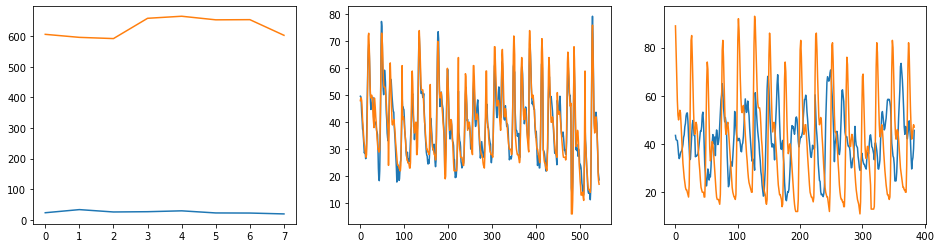

Epoch 8
-------------------------------
loss: 19.659307  [    0/   66]
loss: 30.644024  [   32/   66]
loss: 2.891682  [    4/   66]
Test loss: 590.139893 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


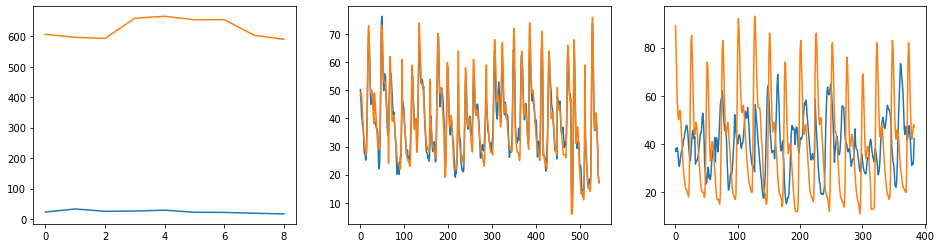

Epoch 8
-------------------------------
loss: 19.313370  [    0/   66]
loss: 27.172749  [   32/   66]
loss: 1.503600  [    4/   66]
Test loss: 587.393127 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


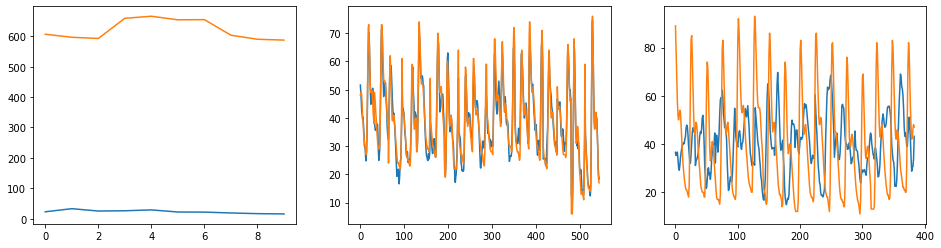

Epoch 8
-------------------------------
loss: 18.355965  [    0/   66]
loss: 25.028711  [   32/   66]
loss: 1.614650  [    4/   66]
Test loss: 596.487976 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


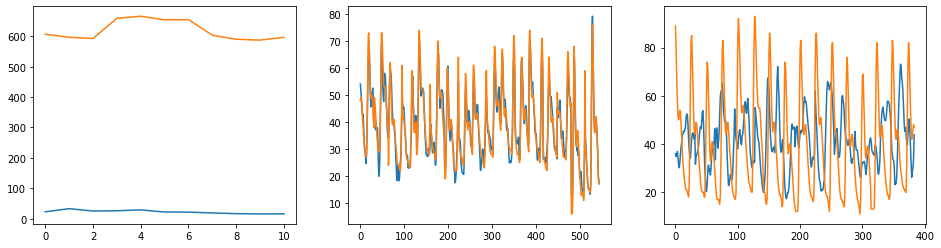

Epoch 8
-------------------------------
loss: 16.459637  [    0/   66]
loss: 22.436378  [   32/   66]
loss: 0.999186  [    4/   66]
Test loss: 578.562866 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


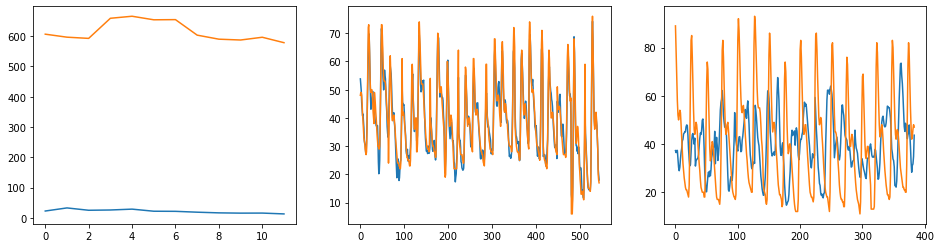

Epoch 8
-------------------------------
loss: 15.540646  [    0/   66]
loss: 20.953648  [   32/   66]
loss: 0.772432  [    4/   66]
Test loss: 590.186035 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


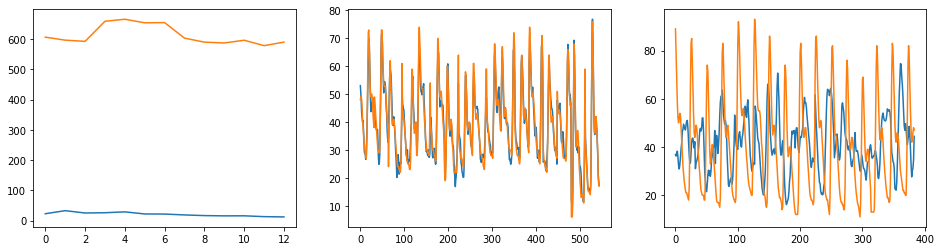

Epoch 8
-------------------------------
loss: 14.343540  [    0/   66]
loss: 19.119297  [   32/   66]
loss: 1.102168  [    4/   66]
Test loss: 586.857727 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


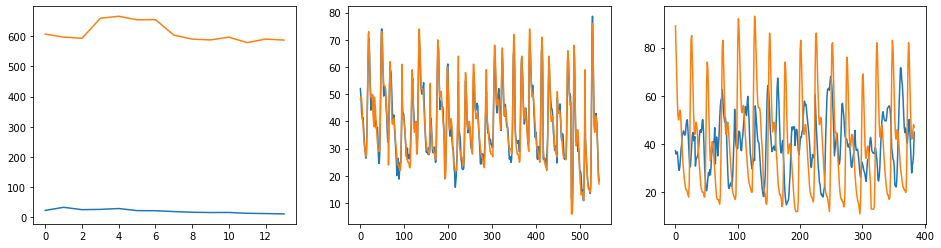

Epoch 8
-------------------------------
loss: 13.457842  [    0/   66]
loss: 17.889647  [   32/   66]
loss: 1.136649  [    4/   66]
Test loss: 583.161926 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


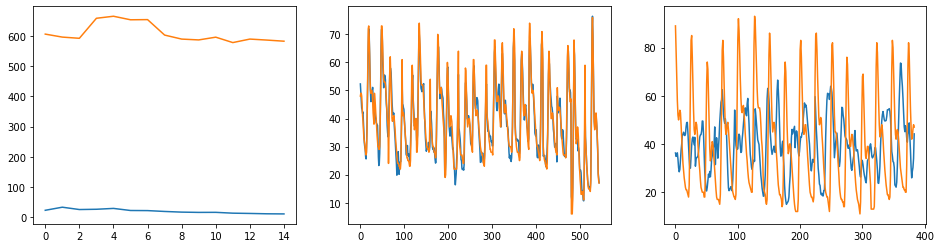

Epoch 8
-------------------------------
loss: 12.543672  [    0/   66]
loss: 16.528250  [   32/   66]
loss: 0.954552  [    4/   66]
Test loss: 583.053894 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


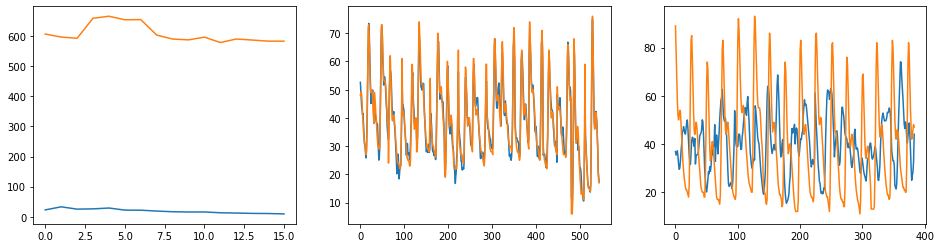

Epoch 8
-------------------------------
loss: 11.690693  [    0/   66]
loss: 15.520811  [   32/   66]
loss: 0.531779  [    4/   66]
Test loss: 581.301697 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


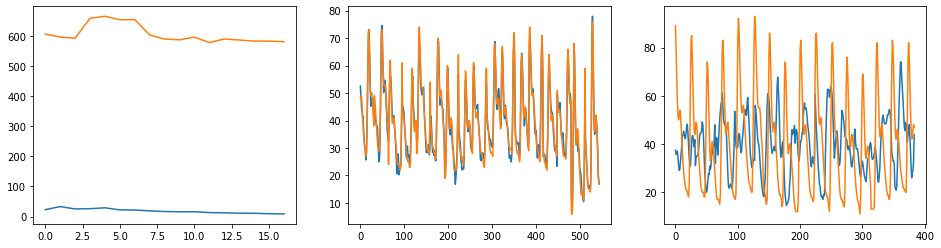

Epoch 8
-------------------------------
loss: 11.108861  [    0/   66]
loss: 14.436840  [   32/   66]
loss: 0.254982  [    4/   66]
Test loss: 589.766357 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


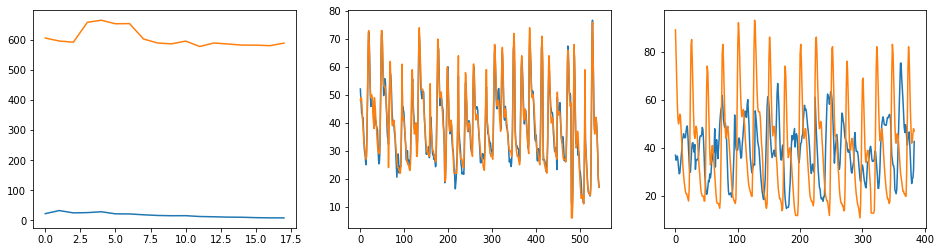

Epoch 8
-------------------------------
loss: 10.439854  [    0/   66]
loss: 13.469713  [   32/   66]
loss: 0.230755  [    4/   66]
Test loss: 579.689392 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


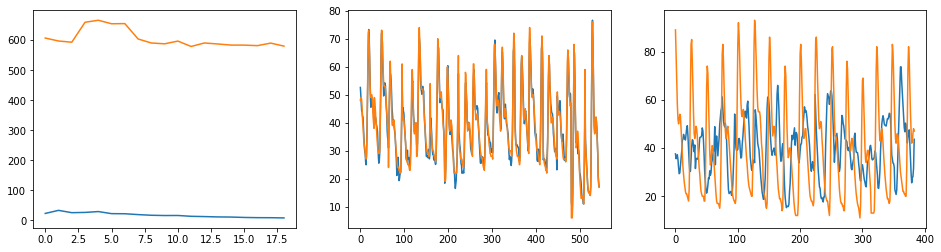

Epoch 8
-------------------------------
loss: 9.885068  [    0/   66]
loss: 12.447506  [   32/   66]
loss: 0.270283  [    4/   66]
Test loss: 594.916382 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


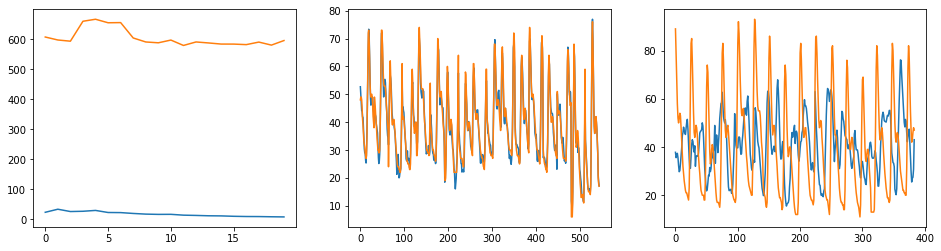

Epoch 8
-------------------------------
loss: 9.332348  [    0/   66]
loss: 11.624574  [   32/   66]
loss: 0.384697  [    4/   66]
Test loss: 585.332764 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


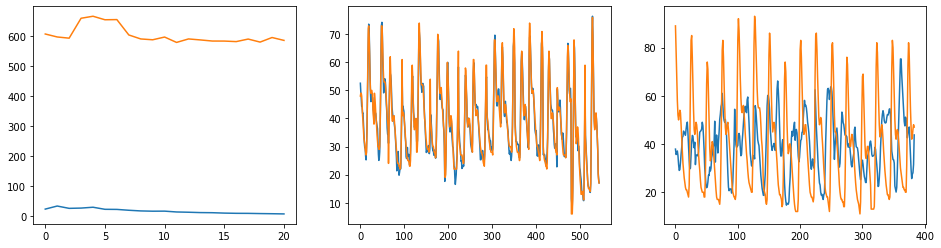

Epoch 8
-------------------------------
loss: 8.686501  [    0/   66]
loss: 10.943367  [   32/   66]
loss: 0.446433  [    4/   66]
Test loss: 592.784607 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


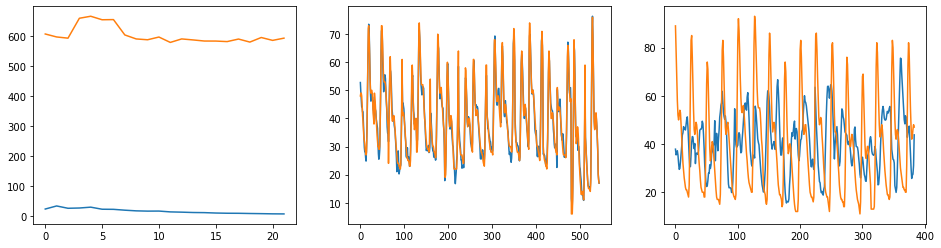

Epoch 8
-------------------------------
loss: 8.170383  [    0/   66]
loss: 10.299463  [   32/   66]
loss: 0.826638  [    4/   66]
Test loss: 587.801453 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


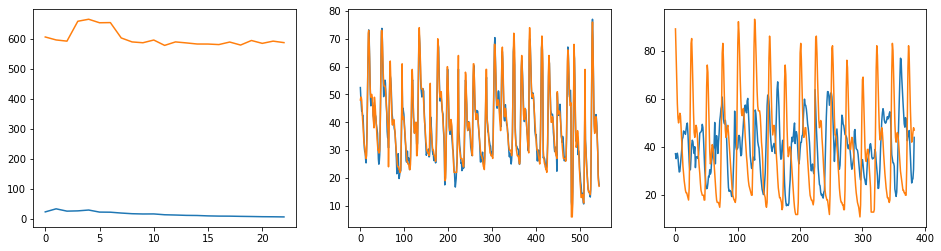

Epoch 8
-------------------------------
loss: 7.769009  [    0/   66]
loss: 9.838834  [   32/   66]
loss: 1.261574  [    4/   66]
Test loss: 586.772156 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


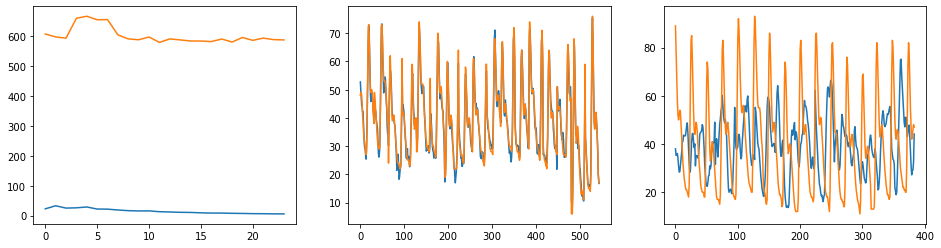

Epoch 8
-------------------------------
loss: 7.760326  [    0/   66]
loss: 9.575324  [   32/   66]
loss: 2.071964  [    4/   66]
Test loss: 610.772644 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


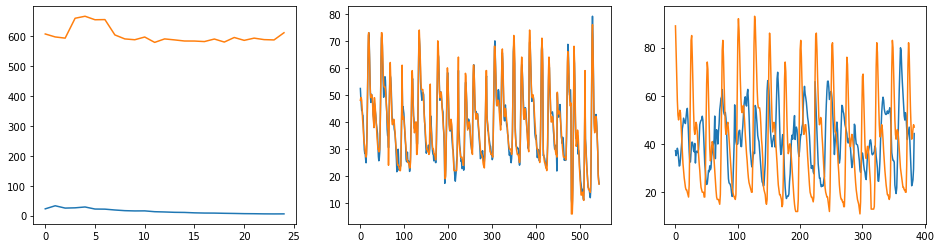

Epoch 8
-------------------------------
loss: 8.534655  [    0/   66]
loss: 9.605591  [   32/   66]
loss: 2.945073  [    4/   66]
Test loss: 571.169800 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


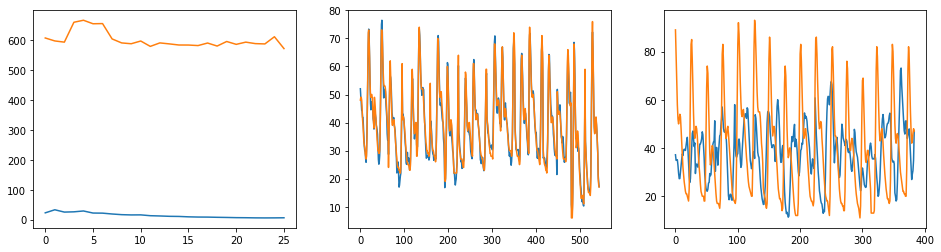

Epoch 8
-------------------------------
loss: 10.247822  [    0/   66]
loss: 9.726526  [   32/   66]
loss: 3.644390  [    4/   66]
Test loss: 645.494690 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


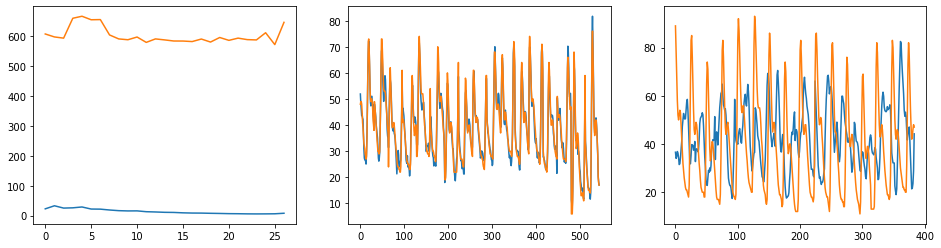

Epoch 8
-------------------------------
loss: 12.046983  [    0/   66]
loss: 11.458490  [   32/   66]
loss: 2.377557  [    4/   66]
Test loss: 569.414490 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


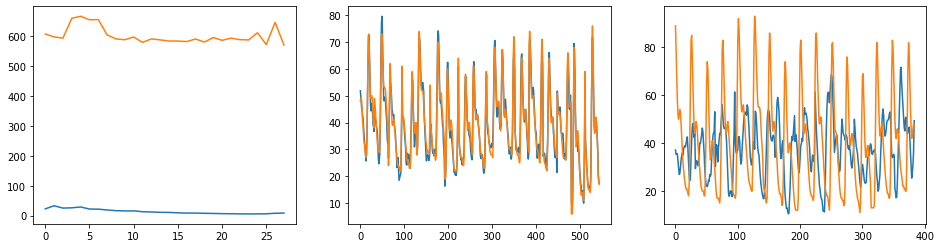

Epoch 8
-------------------------------
loss: 10.749701  [    0/   66]
loss: 12.130730  [   32/   66]
loss: 1.353009  [    4/   66]
Test loss: 630.828491 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


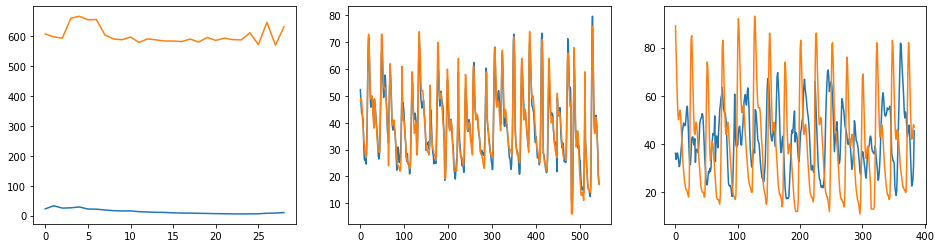

Epoch 8
-------------------------------
loss: 8.215189  [    0/   66]
loss: 11.768337  [   32/   66]
loss: 1.884632  [    4/   66]
Test loss: 605.408936 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


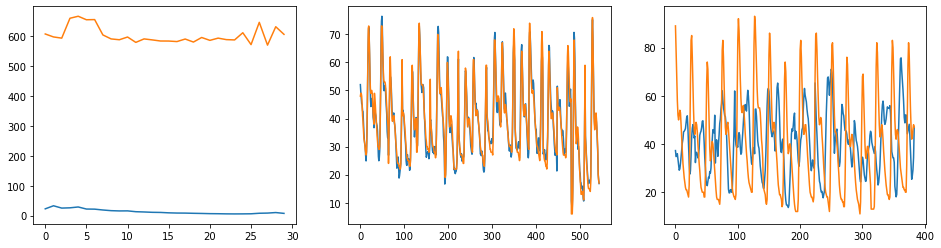

Epoch 8
-------------------------------
loss: 6.603135  [    0/   66]
loss: 8.752861  [   32/   66]
loss: 3.115466  [    4/   66]
Test loss: 575.137634 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


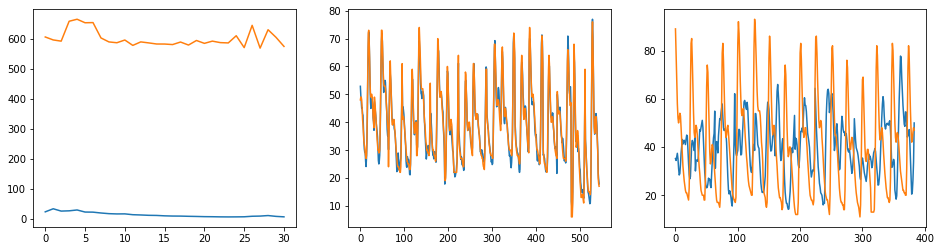

Epoch 8
-------------------------------
loss: 7.987412  [    0/   66]
loss: 8.189497  [   32/   66]
loss: 4.444529  [    4/   66]
Test loss: 624.458313 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


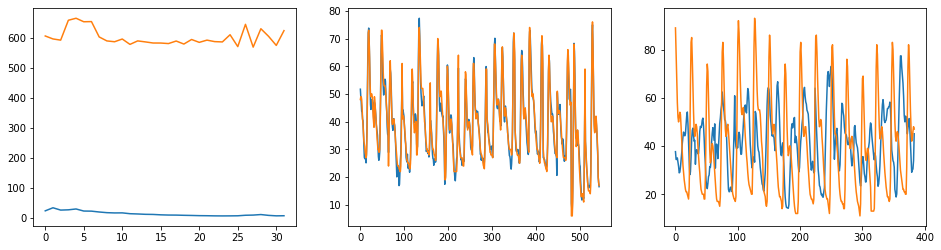

Epoch 8
-------------------------------
loss: 7.436736  [    0/   66]
loss: 9.480944  [   32/   66]
loss: 8.849627  [    4/   66]
Test loss: 604.042480 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


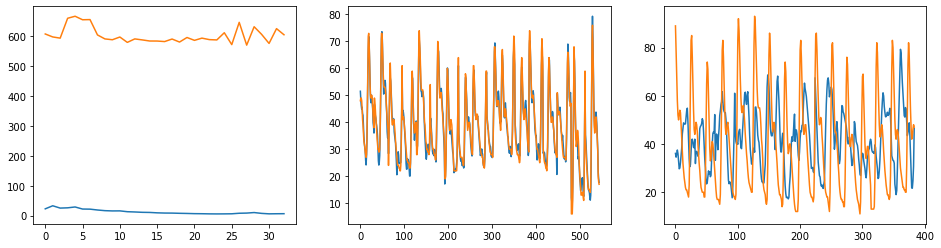

Epoch 8
-------------------------------
loss: 6.416311  [    0/   66]
loss: 8.331942  [   32/   66]
loss: 7.665484  [    4/   66]
Test loss: 574.678772 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


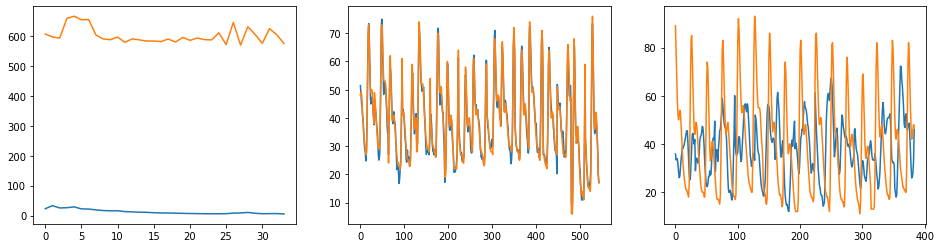

Epoch 8
-------------------------------
loss: 6.185900  [    0/   66]
loss: 8.196148  [   32/   66]
loss: 4.516095  [    4/   66]
Test loss: 597.884583 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


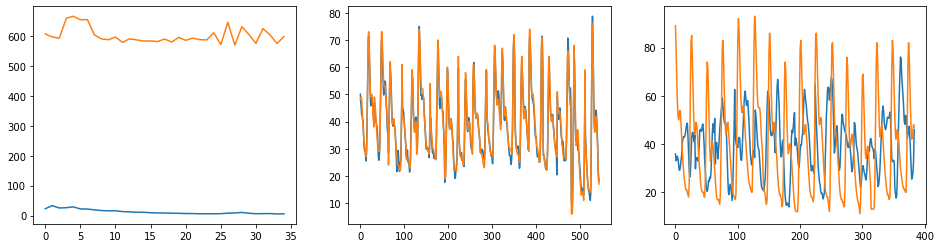

Epoch 8
-------------------------------
loss: 5.474499  [    0/   66]
loss: 7.983127  [   32/   66]
loss: 2.813974  [    4/   66]
Test loss: 599.374329 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


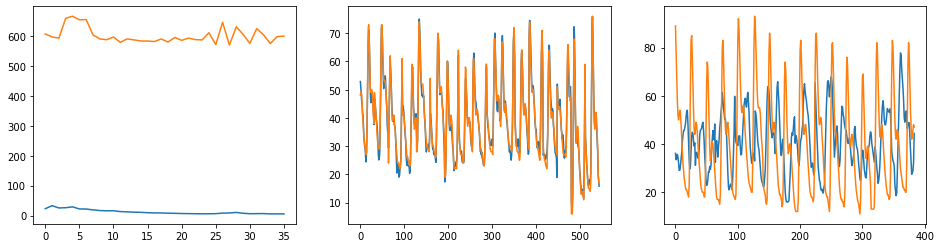

Epoch 8
-------------------------------
loss: 5.590357  [    0/   66]
loss: 6.417100  [   32/   66]
loss: 1.592167  [    4/   66]
Test loss: 579.539368 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


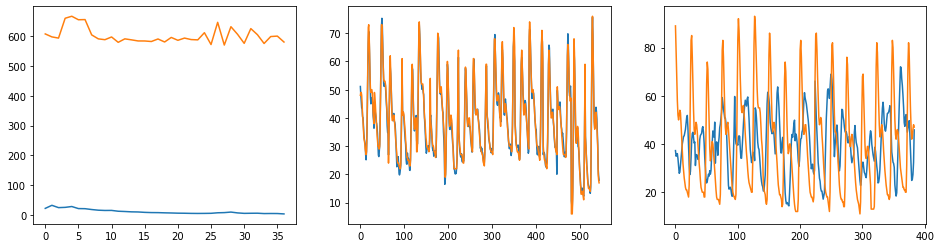

Epoch 8
-------------------------------
loss: 5.299833  [    0/   66]
loss: 5.648577  [   32/   66]
loss: 0.945557  [    4/   66]
Test loss: 591.184143 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


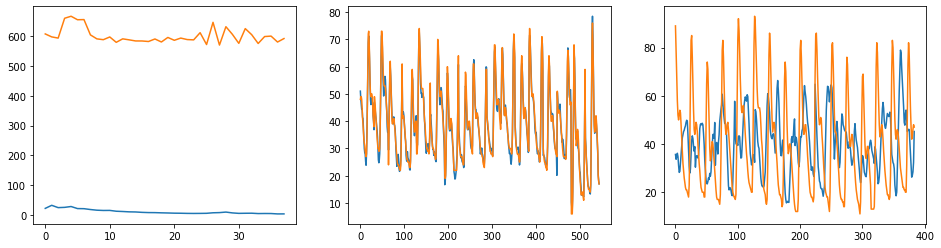

Epoch 8
-------------------------------
loss: 5.013457  [    0/   66]
loss: 5.317117  [   32/   66]
loss: 0.390780  [    4/   66]
Test loss: 588.782288 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


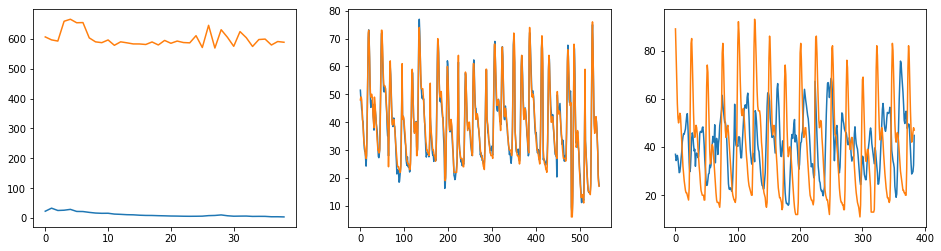

Epoch 8
-------------------------------
loss: 4.741375  [    0/   66]
loss: 4.982964  [   32/   66]
loss: 0.314793  [    4/   66]
Test loss: 590.919861 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


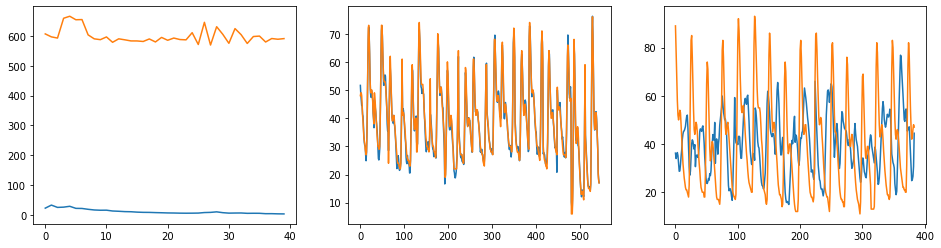

Epoch 8
-------------------------------
loss: 4.129937  [    0/   66]
loss: 4.903873  [   32/   66]
loss: 0.463548  [    4/   66]
Test loss: 587.032654 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


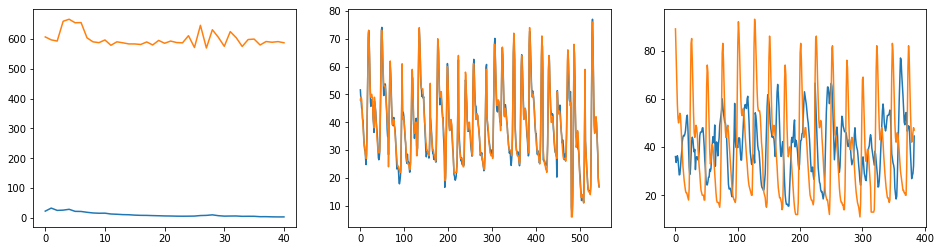

Epoch 8
-------------------------------
loss: 3.735462  [    0/   66]
loss: 4.429698  [   32/   66]
loss: 0.309711  [    4/   66]
Test loss: 582.006775 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


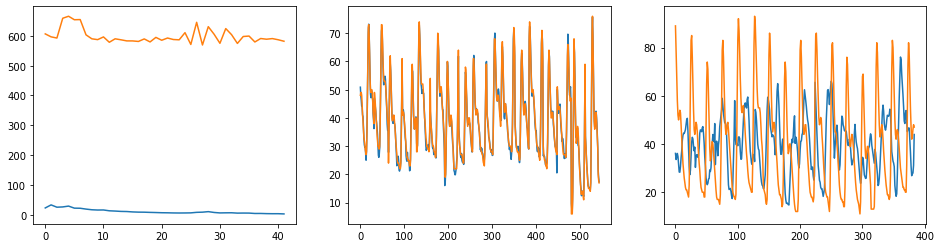

Epoch 8
-------------------------------
loss: 3.525165  [    0/   66]
loss: 3.951534  [   32/   66]
loss: 0.210731  [    4/   66]
Test loss: 587.572083 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


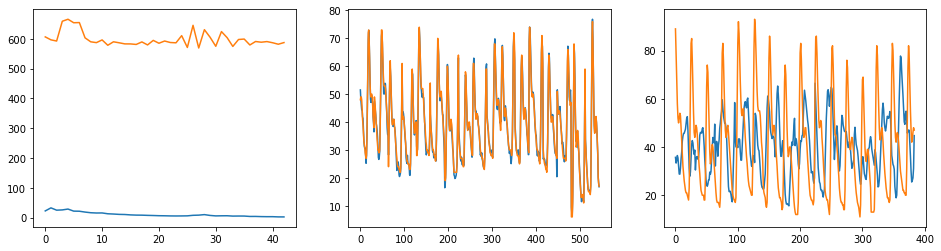

Epoch 8
-------------------------------
loss: 3.388593  [    0/   66]
loss: 3.626082  [   32/   66]
loss: 0.156105  [    4/   66]
Test loss: 587.047180 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


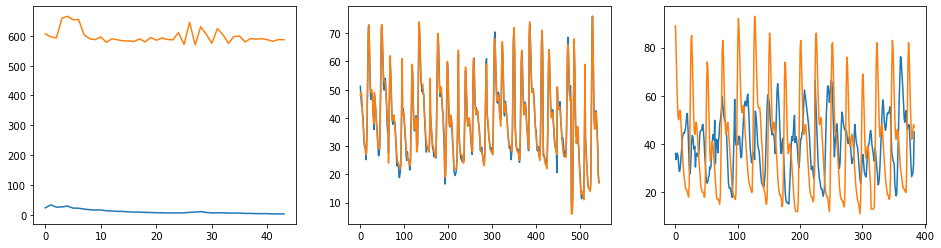

Epoch 8
-------------------------------
loss: 3.341182  [    0/   66]
loss: 3.403724  [   32/   66]
loss: 0.170892  [    4/   66]
Test loss: 589.223694 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


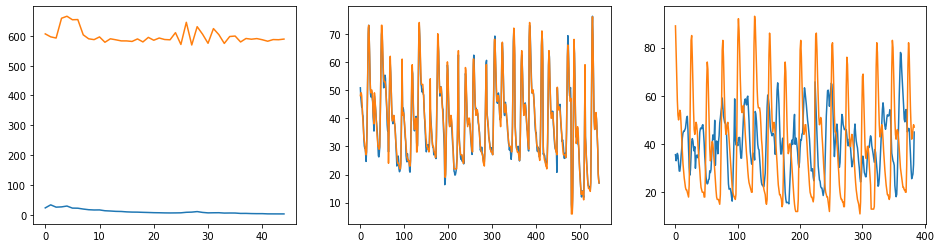

Epoch 8
-------------------------------
loss: 3.151265  [    0/   66]
loss: 3.223555  [   32/   66]
loss: 0.231992  [    4/   66]
Test loss: 585.718201 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


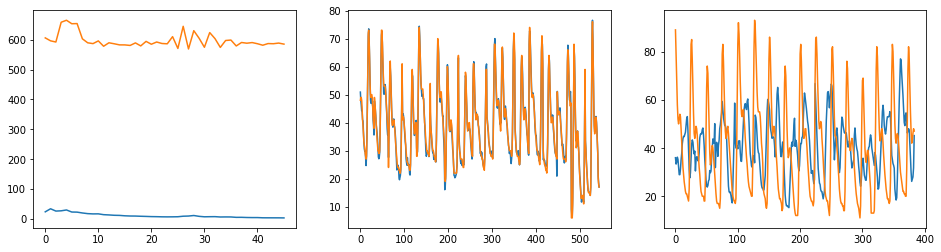

Epoch 8
-------------------------------
loss: 2.973380  [    0/   66]
loss: 3.032544  [   32/   66]
loss: 0.213609  [    4/   66]
Test loss: 587.688477 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


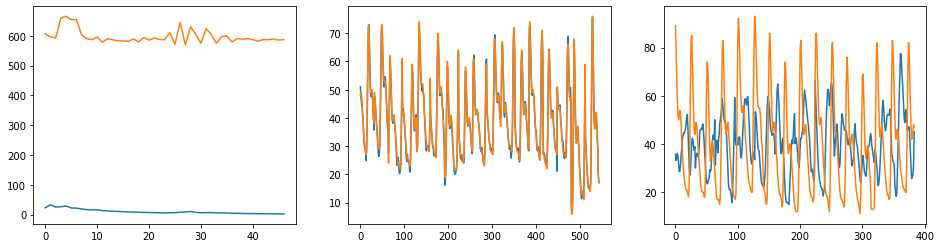

Epoch 8
-------------------------------
loss: 2.814126  [    0/   66]
loss: 2.886537  [   32/   66]
loss: 0.197799  [    4/   66]
Test loss: 586.817200 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


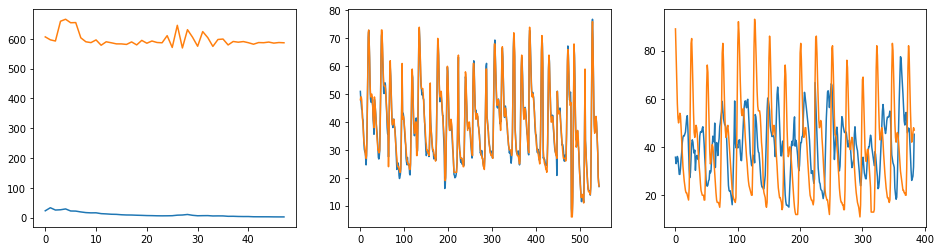

Epoch 8
-------------------------------
loss: 2.700613  [    0/   66]
loss: 2.721967  [   32/   66]
loss: 0.171367  [    4/   66]
Test loss: 587.678101 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


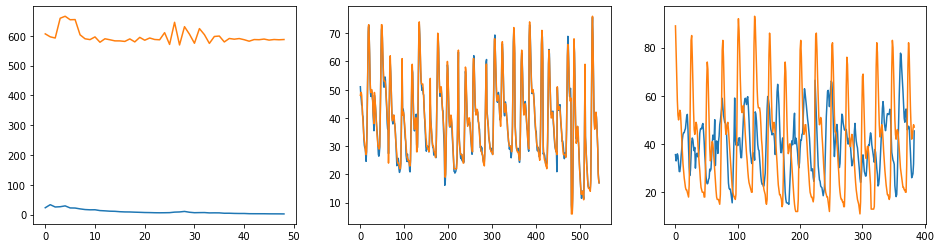

Epoch 8
-------------------------------
loss: 2.593727  [    0/   66]
loss: 2.578294  [   32/   66]
loss: 0.149301  [    4/   66]
Test loss: 588.961121 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


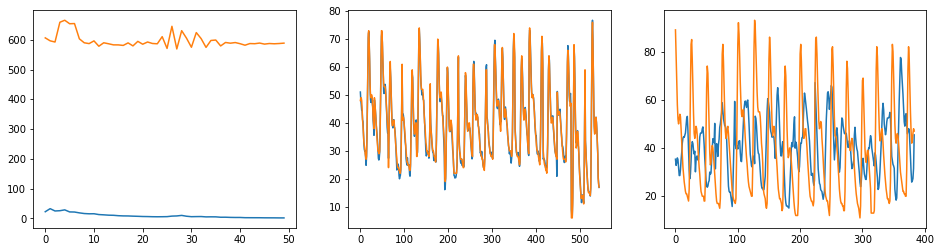

Epoch 8
-------------------------------
loss: 2.490575  [    0/   66]
loss: 2.436918  [   32/   66]
loss: 0.146034  [    4/   66]
Test loss: 588.786072 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


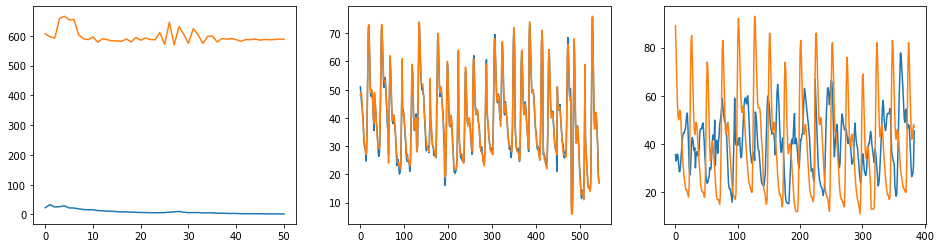

Epoch 8
-------------------------------
loss: 2.398801  [    0/   66]
loss: 2.320089  [   32/   66]
loss: 0.156219  [    4/   66]
Test loss: 587.822021 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


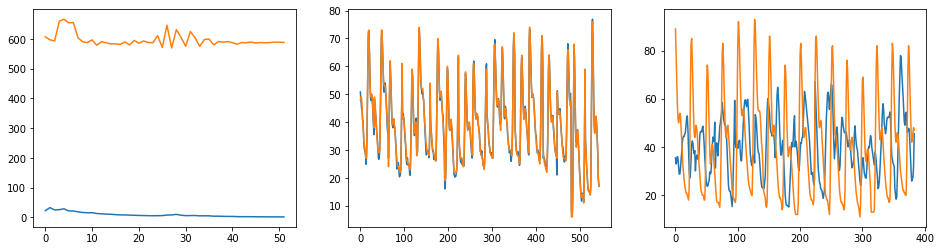

Epoch 8
-------------------------------
loss: 2.300569  [    0/   66]
loss: 2.224007  [   32/   66]
loss: 0.126394  [    4/   66]
Test loss: 590.188721 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


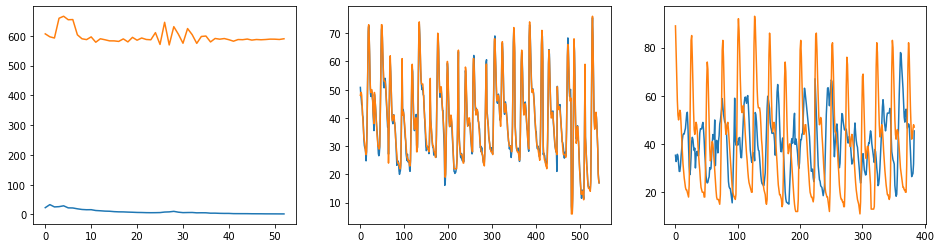

Epoch 8
-------------------------------
loss: 2.233322  [    0/   66]
loss: 2.127130  [   32/   66]
loss: 0.121950  [    4/   66]
Test loss: 588.828430 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


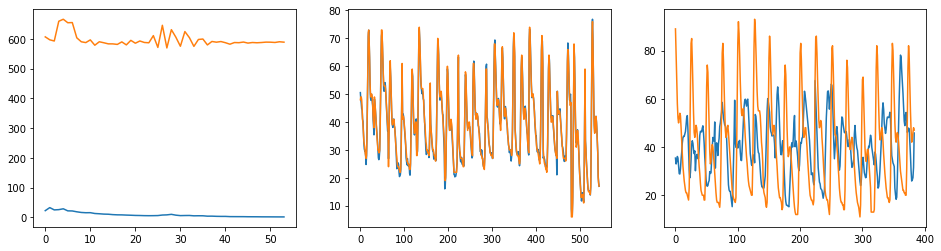

Epoch 8
-------------------------------
loss: 2.157525  [    0/   66]
loss: 2.035830  [   32/   66]
loss: 0.112695  [    4/   66]
Test loss: 589.881897 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


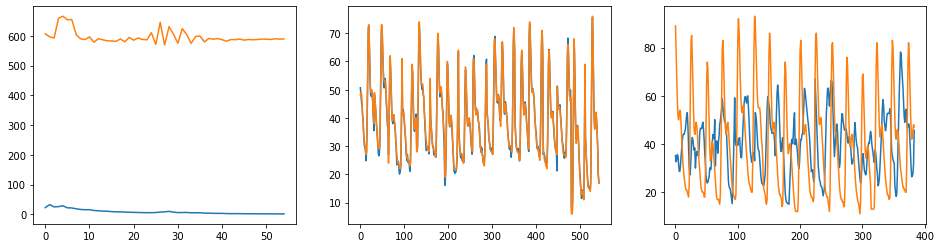

Epoch 8
-------------------------------
loss: 2.079068  [    0/   66]
loss: 1.954989  [   32/   66]
loss: 0.127803  [    4/   66]
Test loss: 589.634216 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


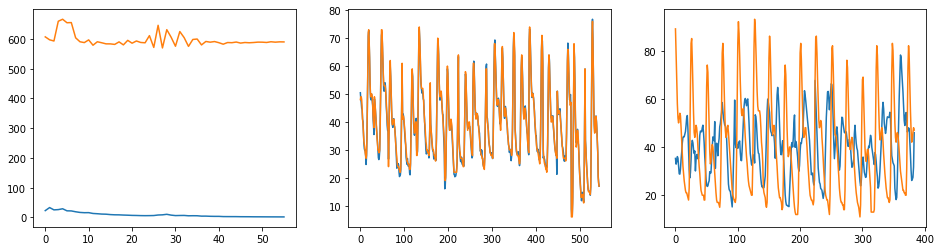

Epoch 8
-------------------------------
loss: 2.013376  [    0/   66]
loss: 1.877771  [   32/   66]
loss: 0.138439  [    4/   66]
Test loss: 589.988037 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


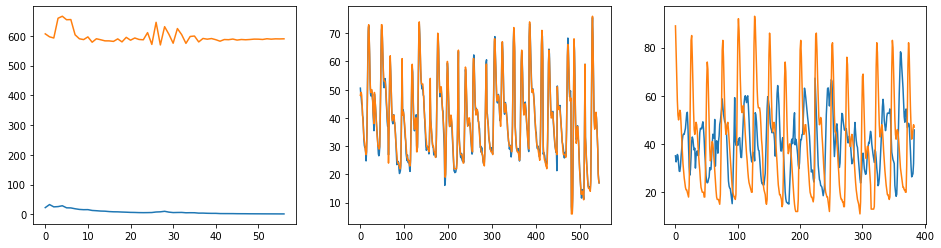

Epoch 8
-------------------------------
loss: 1.950359  [    0/   66]
loss: 1.807821  [   32/   66]
loss: 0.177452  [    4/   66]
Test loss: 589.280762 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


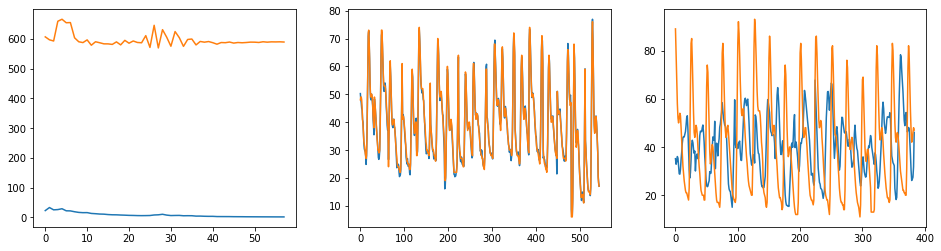

Epoch 8
-------------------------------
loss: 1.897600  [    0/   66]
loss: 1.754342  [   32/   66]
loss: 0.216334  [    4/   66]
Test loss: 590.833740 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


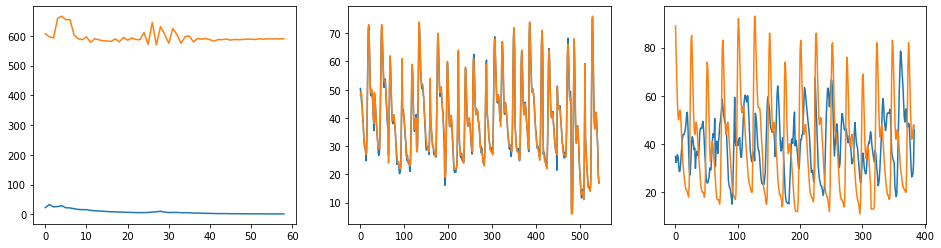

Epoch 8
-------------------------------
loss: 1.841405  [    0/   66]
loss: 1.712315  [   32/   66]
loss: 0.303002  [    4/   66]
Test loss: 588.720520 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


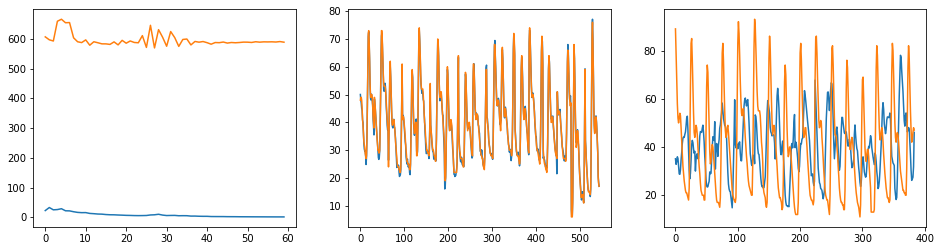

Epoch 8
-------------------------------
loss: 1.794009  [    0/   66]
loss: 1.693725  [   32/   66]
loss: 0.401128  [    4/   66]
Test loss: 589.992981 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


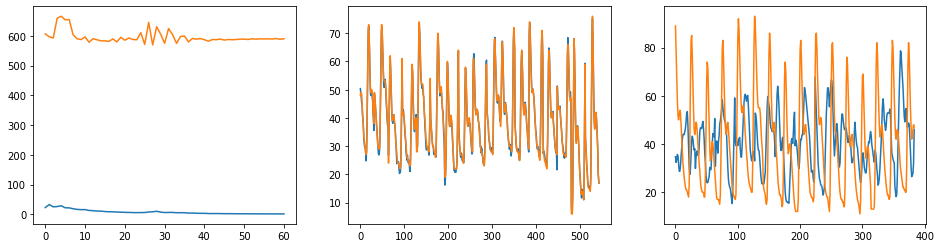

Epoch 8
-------------------------------
loss: 1.763262  [    0/   66]
loss: 1.683823  [   32/   66]
loss: 0.584479  [    4/   66]
Test loss: 587.818359 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


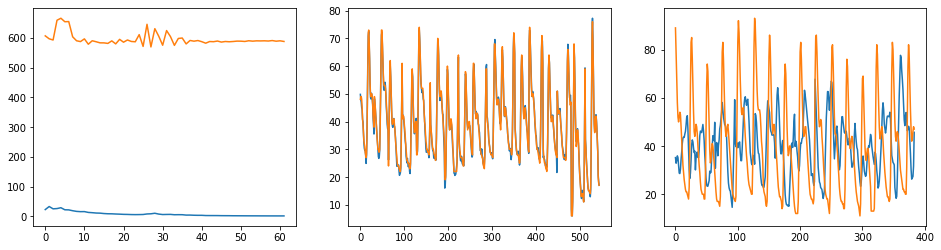

Epoch 8
-------------------------------
loss: 1.737002  [    0/   66]
loss: 1.731630  [   32/   66]
loss: 0.790485  [    4/   66]
Test loss: 590.273132 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


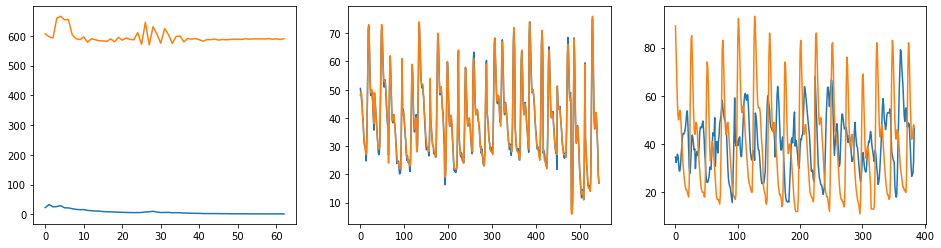

Epoch 8
-------------------------------
loss: 1.774251  [    0/   66]
loss: 1.813323  [   32/   66]
loss: 1.140383  [    4/   66]
Test loss: 589.046814 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


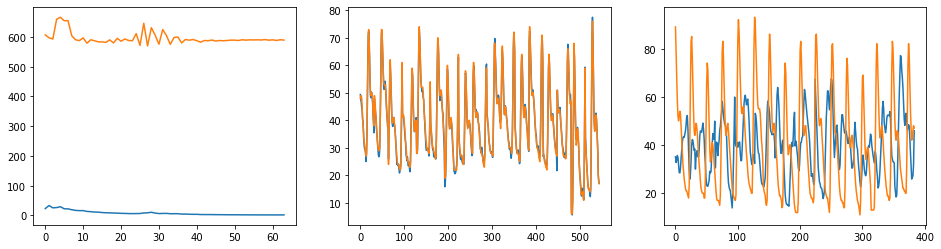

Epoch 8
-------------------------------
loss: 1.823873  [    0/   66]
loss: 1.996123  [   32/   66]
loss: 1.467121  [    4/   66]
Test loss: 593.738831 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


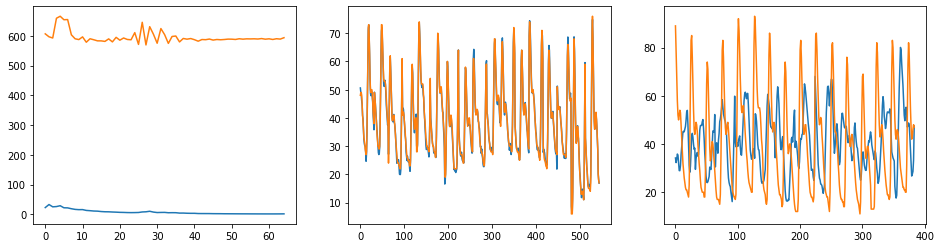

Epoch 8
-------------------------------
loss: 1.962756  [    0/   66]
loss: 2.177835  [   32/   66]
loss: 1.985011  [    4/   66]
Test loss: 588.795715 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


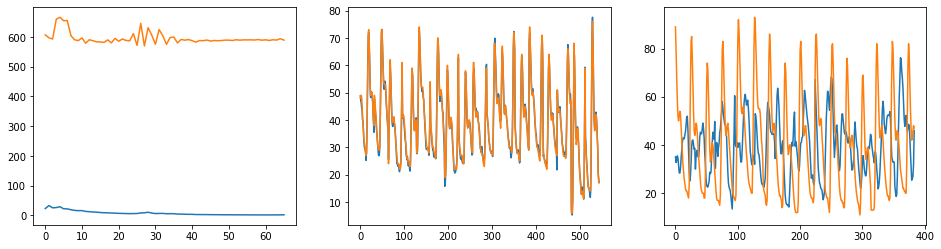

Epoch 8
-------------------------------
loss: 2.084257  [    0/   66]
loss: 2.431571  [   32/   66]
loss: 2.322781  [    4/   66]
Test loss: 594.165283 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


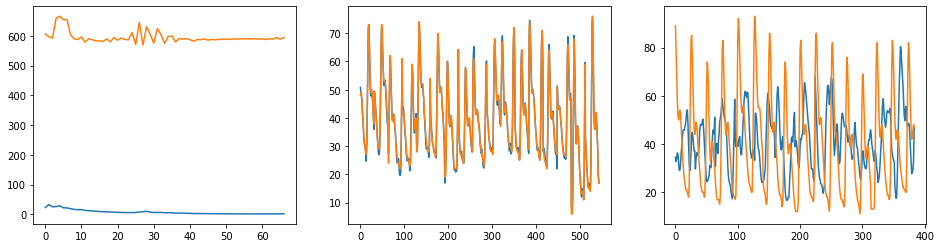

Epoch 8
-------------------------------
loss: 2.156480  [    0/   66]
loss: 2.471848  [   32/   66]
loss: 2.813424  [    4/   66]
Test loss: 582.618103 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


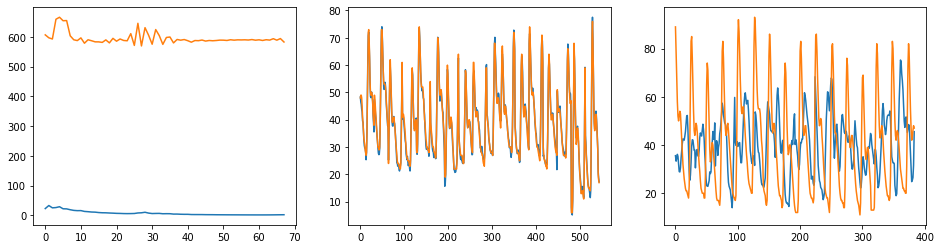

Epoch 8
-------------------------------
loss: 2.241316  [    0/   66]
loss: 2.407444  [   32/   66]
loss: 2.852240  [    4/   66]
Test loss: 593.160950 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


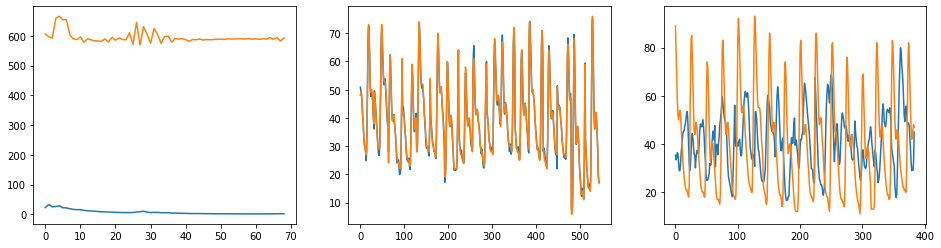

Epoch 8
-------------------------------
loss: 2.365903  [    0/   66]
loss: 2.019391  [   32/   66]
loss: 2.804435  [    4/   66]
Test loss: 573.418152 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


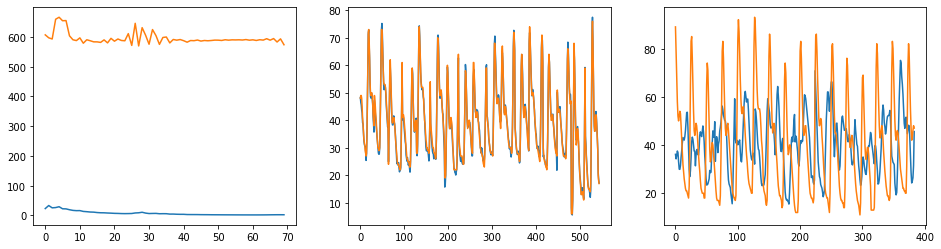

Epoch 8
-------------------------------
loss: 2.800874  [    0/   66]
loss: 1.692764  [   32/   66]
loss: 2.087727  [    4/   66]
Test loss: 594.288879 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


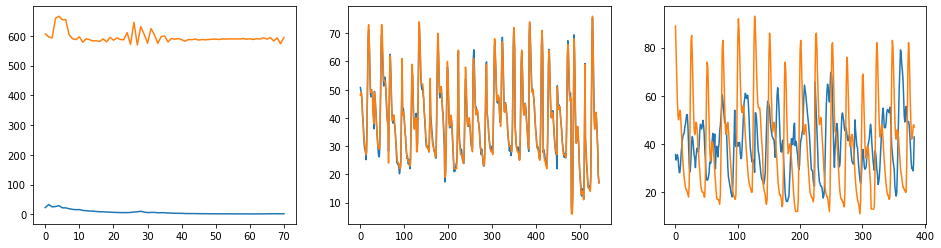

Epoch 8
-------------------------------
loss: 3.586045  [    0/   66]
loss: 1.539794  [   32/   66]
loss: 1.280427  [    4/   66]
Test loss: 569.458069 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


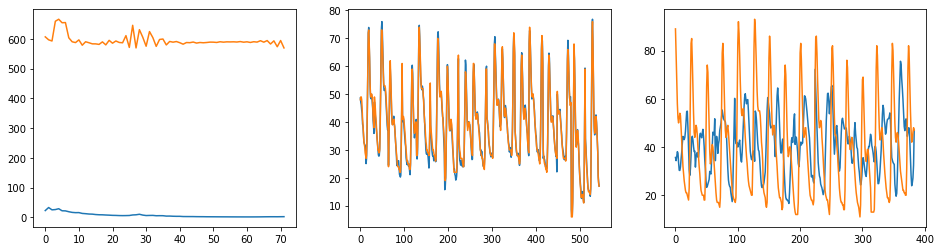

Epoch 8
-------------------------------
loss: 3.866201  [    0/   66]
loss: 1.693603  [   32/   66]
loss: 0.544438  [    4/   66]
Test loss: 595.283752 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


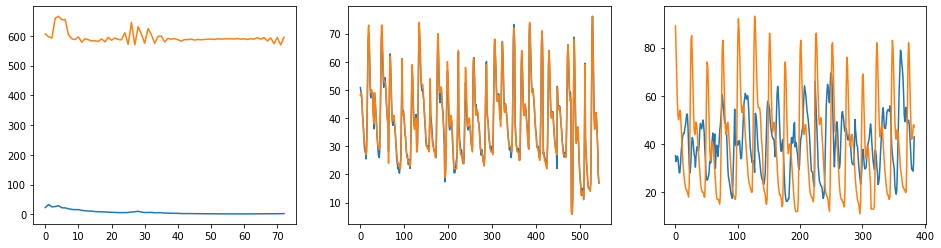

Epoch 8
-------------------------------
loss: 3.570420  [    0/   66]
loss: 1.930623  [   32/   66]
loss: 0.231553  [    4/   66]
Test loss: 571.071228 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


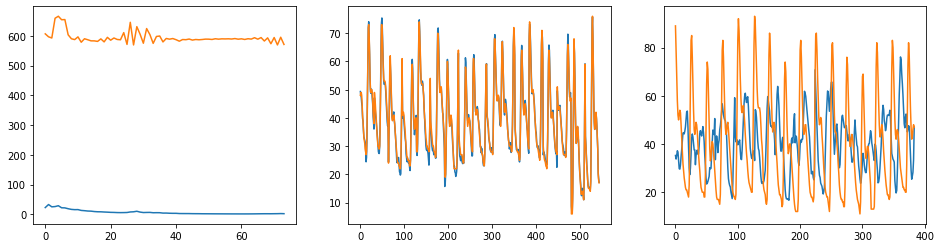

Epoch 8
-------------------------------
loss: 2.391648  [    0/   66]
loss: 1.779606  [   32/   66]
loss: 0.261880  [    4/   66]
Test loss: 586.873108 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


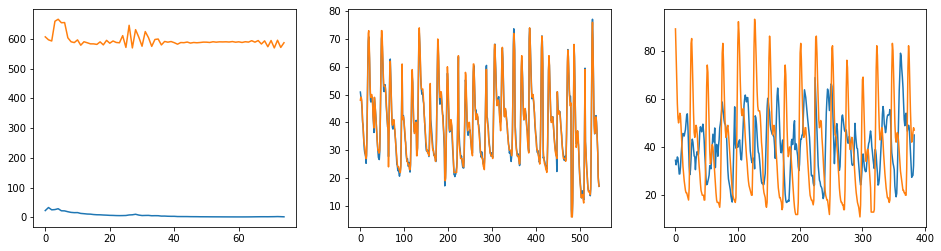

Epoch 8
-------------------------------
loss: 1.664531  [    0/   66]
loss: 1.459085  [   32/   66]
loss: 0.326746  [    4/   66]
Test loss: 575.953125 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


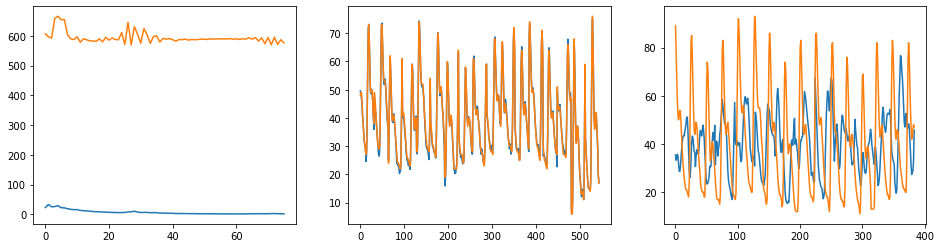

Epoch 8
-------------------------------
loss: 1.536214  [    0/   66]
loss: 1.309462  [   32/   66]
loss: 0.280764  [    4/   66]
Test loss: 579.700989 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


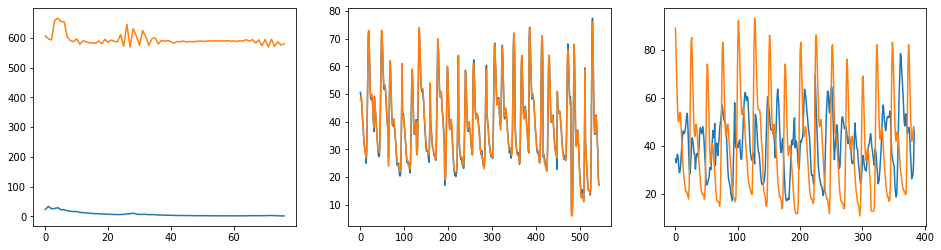

Epoch 8
-------------------------------
loss: 1.594369  [    0/   66]
loss: 1.362853  [   32/   66]
loss: 0.153172  [    4/   66]
Test loss: 577.143188 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


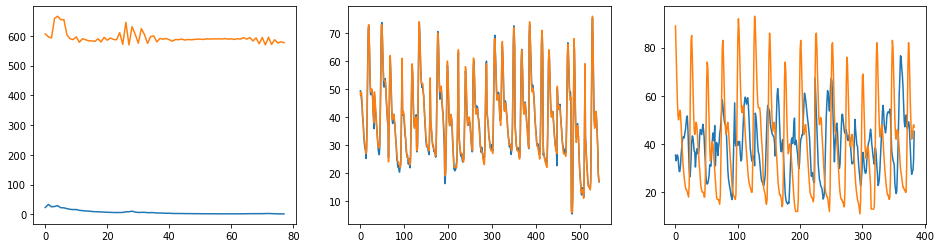

Epoch 8
-------------------------------
loss: 1.524410  [    0/   66]
loss: 1.311809  [   32/   66]
loss: 0.179011  [    4/   66]
Test loss: 580.886719 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


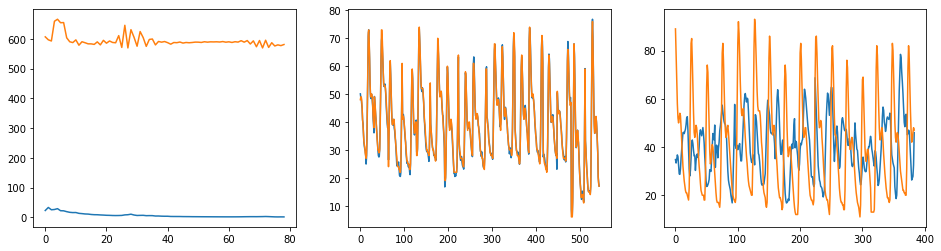

Epoch 8
-------------------------------
loss: 1.524110  [    0/   66]
loss: 1.209153  [   32/   66]
loss: 0.338501  [    4/   66]
Test loss: 573.603455 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


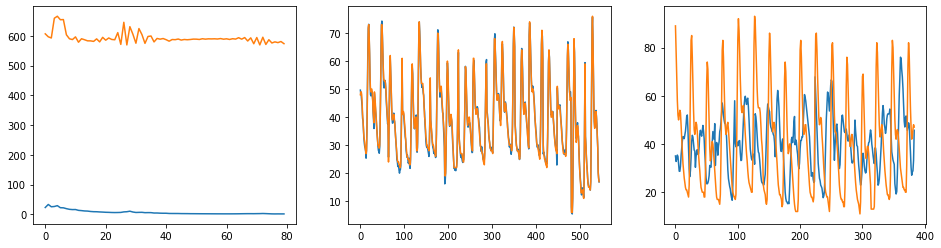

Epoch 8
-------------------------------
loss: 1.436180  [    0/   66]
loss: 1.104658  [   32/   66]
loss: 0.425065  [    4/   66]
Test loss: 583.607849 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


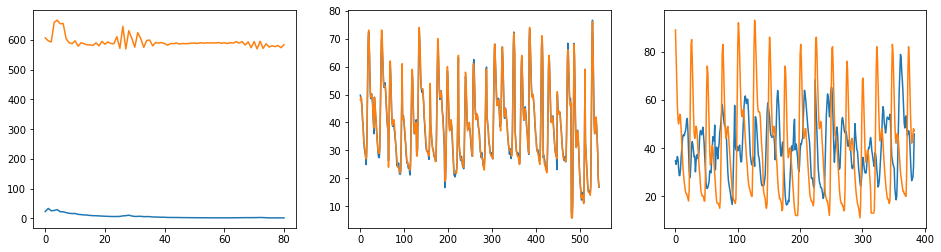

Epoch 8
-------------------------------
loss: 1.420360  [    0/   66]
loss: 1.047239  [   32/   66]
loss: 0.399364  [    4/   66]
Test loss: 573.775940 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


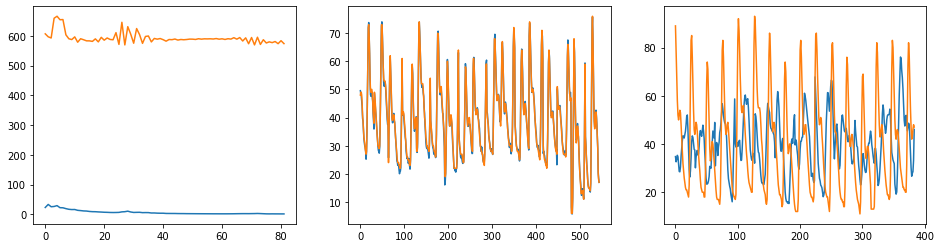

Epoch 8
-------------------------------
loss: 1.295480  [    0/   66]
loss: 0.990547  [   32/   66]
loss: 0.312212  [    4/   66]
Test loss: 583.478394 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


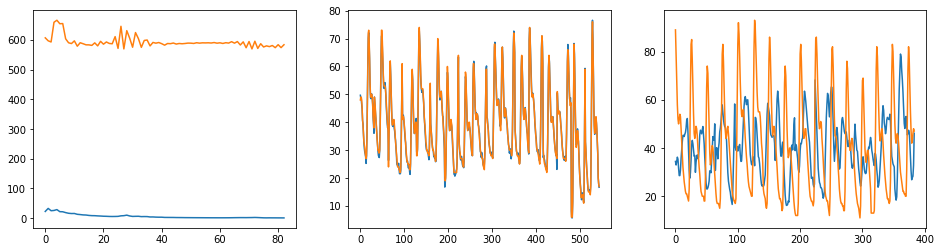

Epoch 8
-------------------------------
loss: 1.242460  [    0/   66]
loss: 0.951216  [   32/   66]
loss: 0.220614  [    4/   66]
Test loss: 577.108032 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


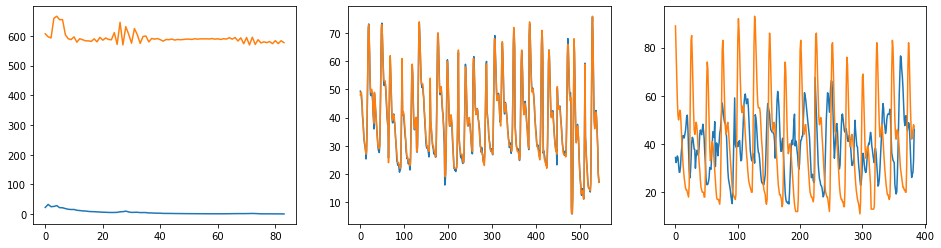

Epoch 8
-------------------------------
loss: 1.204496  [    0/   66]
loss: 0.934045  [   32/   66]
loss: 0.161347  [    4/   66]
Test loss: 582.837219 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


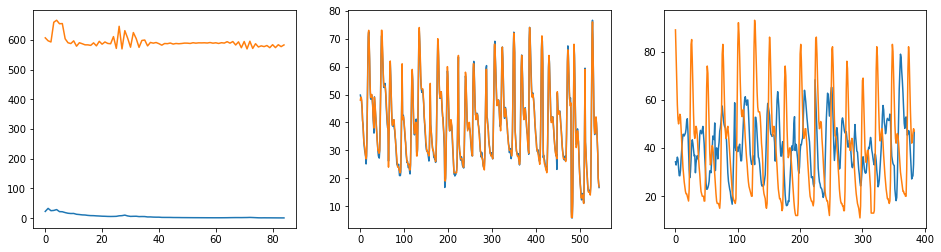

Epoch 8
-------------------------------
loss: 1.261918  [    0/   66]
loss: 0.914921  [   32/   66]
loss: 0.139059  [    4/   66]
Test loss: 578.650574 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


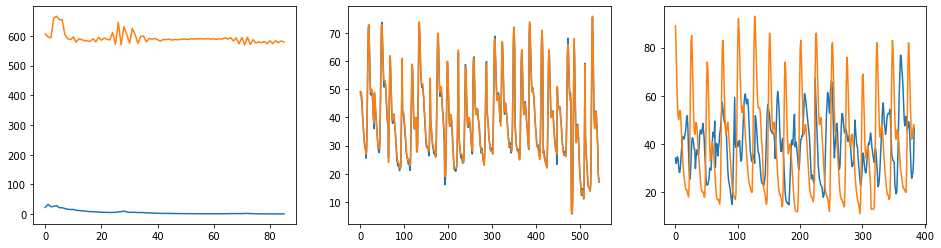

Epoch 8
-------------------------------
loss: 1.278261  [    0/   66]
loss: 0.905302  [   32/   66]
loss: 0.163231  [    4/   66]
Test loss: 583.370300 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


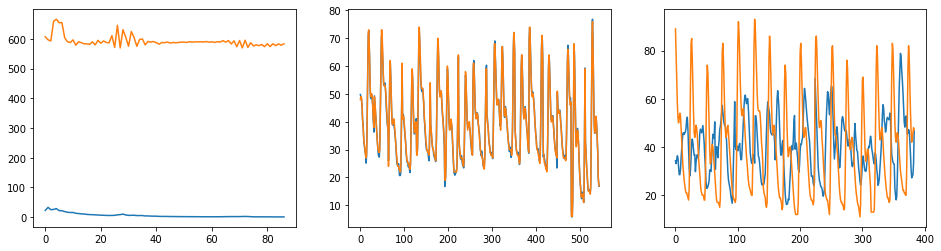

Epoch 8
-------------------------------
loss: 1.318935  [    0/   66]
loss: 0.887881  [   32/   66]
loss: 0.225896  [    4/   66]
Test loss: 577.288208 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


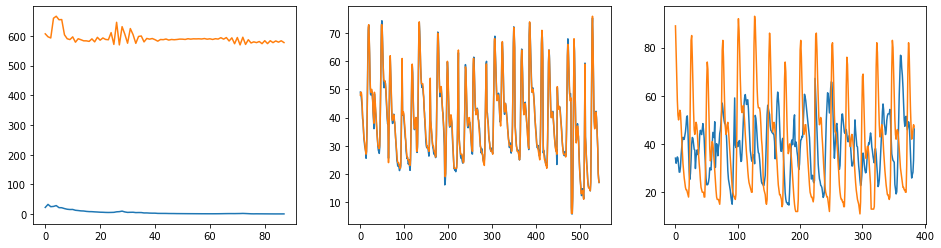

Epoch 8
-------------------------------
loss: 1.267745  [    0/   66]
loss: 0.863027  [   32/   66]
loss: 0.289265  [    4/   66]
Test loss: 584.694580 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


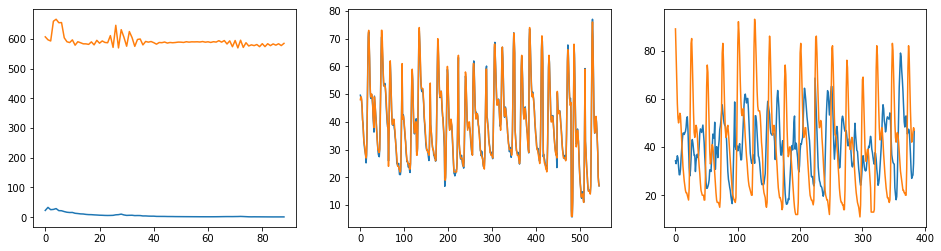

Epoch 8
-------------------------------
loss: 1.271588  [    0/   66]
loss: 0.853725  [   32/   66]
loss: 0.312684  [    4/   66]
Test loss: 576.117859 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


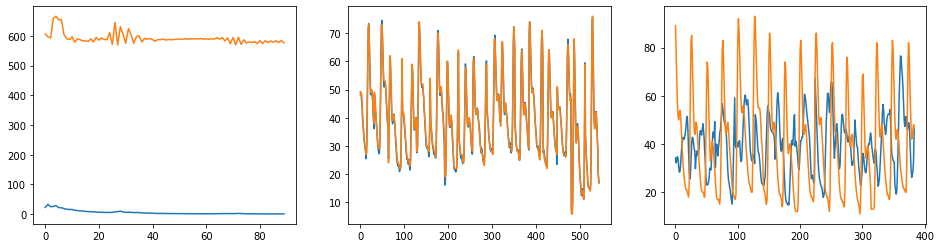

Epoch 8
-------------------------------
loss: 1.197954  [    0/   66]
loss: 0.839983  [   32/   66]
loss: 0.302436  [    4/   66]
Test loss: 585.273132 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


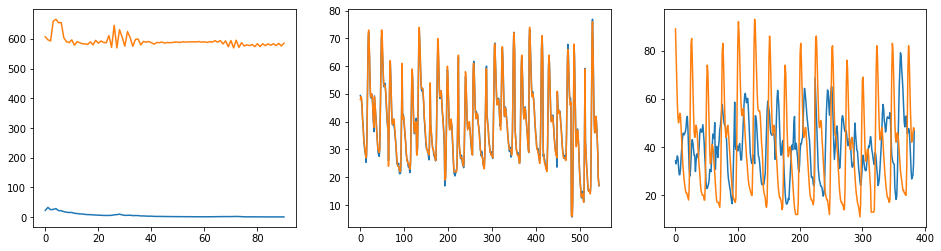

Epoch 8
-------------------------------
loss: 1.201980  [    0/   66]
loss: 0.839102  [   32/   66]
loss: 0.266195  [    4/   66]
Test loss: 575.491943 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


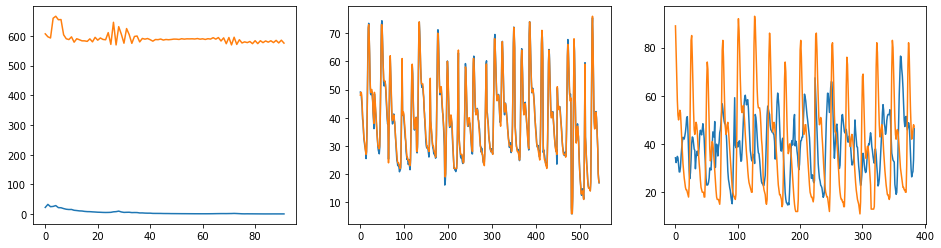

Epoch 8
-------------------------------
loss: 1.136604  [    0/   66]
loss: 0.827973  [   32/   66]
loss: 0.232115  [    4/   66]
Test loss: 585.402344 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


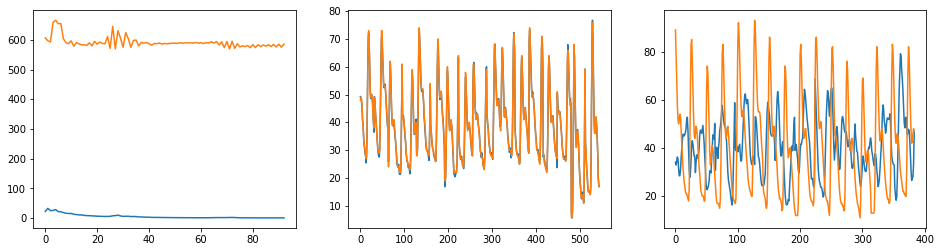

Epoch 8
-------------------------------
loss: 1.133591  [    0/   66]
loss: 0.819053  [   32/   66]
loss: 0.211407  [    4/   66]
Test loss: 575.773315 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


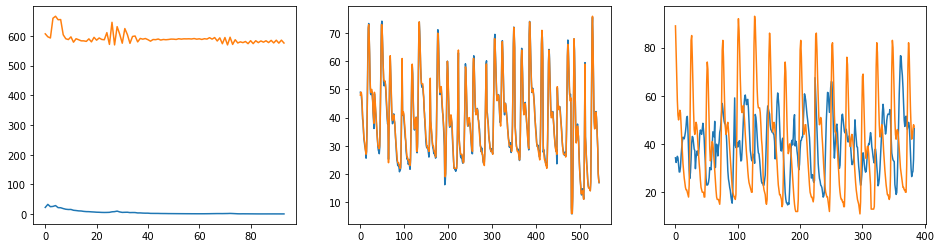

Epoch 8
-------------------------------
loss: 1.079480  [    0/   66]
loss: 0.803562  [   32/   66]
loss: 0.199134  [    4/   66]
Test loss: 584.744080 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


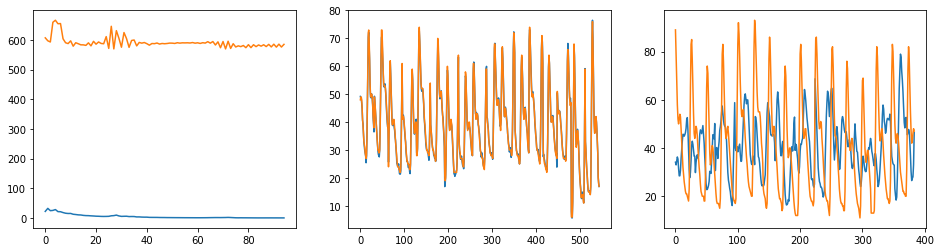

Epoch 8
-------------------------------
loss: 1.078150  [    0/   66]
loss: 0.794814  [   32/   66]
loss: 0.199875  [    4/   66]
Test loss: 575.743835 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


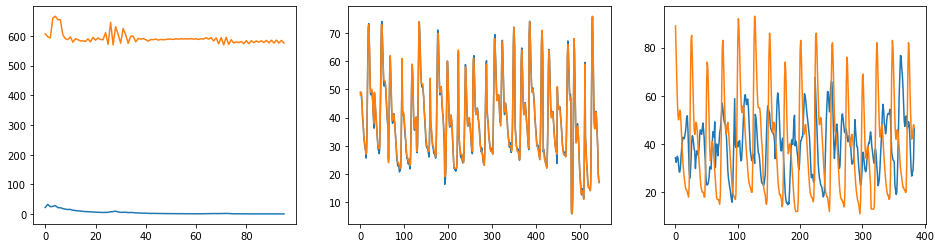

Epoch 8
-------------------------------
loss: 1.046619  [    0/   66]
loss: 0.779853  [   32/   66]
loss: 0.205619  [    4/   66]
Test loss: 584.157898 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


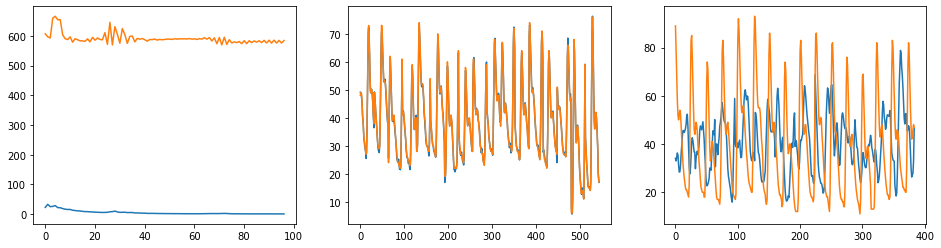

Epoch 8
-------------------------------
loss: 1.051206  [    0/   66]
loss: 0.781019  [   32/   66]
loss: 0.210142  [    4/   66]
Test loss: 575.731873 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


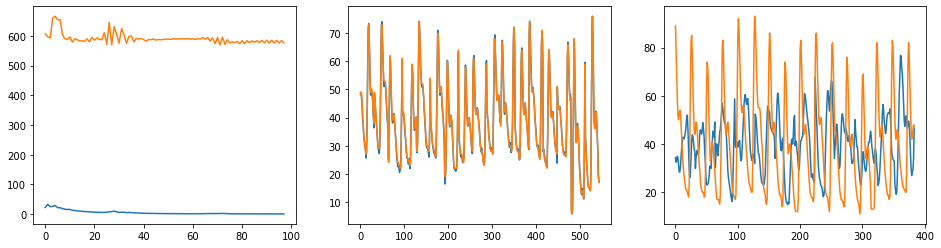

Epoch 8
-------------------------------
loss: 1.039453  [    0/   66]
loss: 0.768019  [   32/   66]
loss: 0.218204  [    4/   66]
Test loss: 584.131531 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


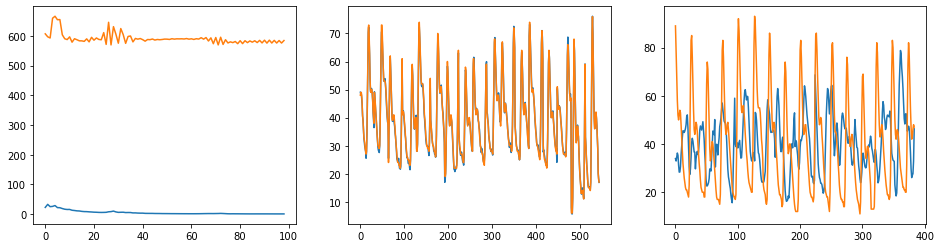

Epoch 8
-------------------------------
loss: 1.056061  [    0/   66]
loss: 0.773486  [   32/   66]
loss: 0.219617  [    4/   66]
Test loss: 575.487671 



/home/sim/anaconda3/envs/rppgtorch/lib/python3.7/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


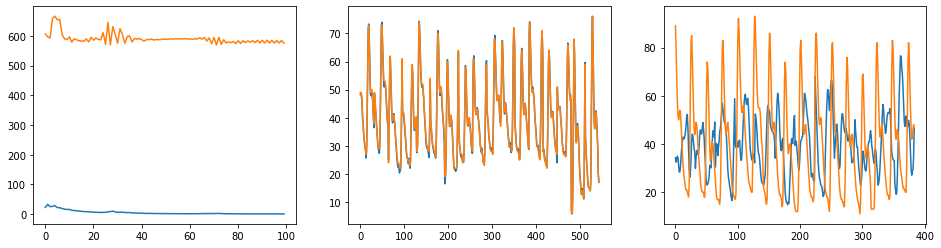

Done!


In [192]:
# from torch.utils.tensorboard import SummaryWriter
# writer = SummaryWriter('logs/fashion_mnist_experiment_1')

model_name = 'PhysNet_v7'

if not os.path.exists('checkpoints'):
    os.mkdir('checkpoints')
if not os.path.exists('checkpoints/'+model_name):
    os.mkdir('checkpoints/'+model_name)


def train_loop(trainloader, model, loss_fn, optimizer):
    model.train()
    size = len(trainloader.dataset)
    train_preds = np.empty(0)
    train_targets = np.empty(0)

    for batch, (inputs, targets) in enumerate(trainloader):
        inputs = inputs.to(device)
        targets = targets.to(device).squeeze()
        pred = model(inputs).squeeze()

        for cnt, pr in enumerate(pred):
            if (batch_size*batch+cnt)%(int(1/overlap)) == 0:
                p = pr.cpu().detach().numpy().squeeze().flatten()
                t = targets[cnt].cpu().detach().numpy().squeeze().flatten()
                train_preds = np.concatenate((train_preds,p))
                train_targets = np.concatenate((train_targets,t))
                
        loss = loss_fn(pred, targets)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch % 1 == 0:
            loss, current = loss.item(), batch * len(targets)
            print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")
            
    return train_preds, train_targets
    
def test_loop(testloader, model, loss_fn):
    size = len(testloader.dataset)
    model.eval()    
    test_loss, correct = 0, 0
    test_preds = np.empty(0)
    test_targets = np.empty(0)

    with torch.no_grad():
        for inputs, targets in testloader:
            inputs = inputs.to(device)
            pred = model(inputs).squeeze()
            
            p = pred.cpu().detach().numpy().squeeze().flatten()
            t = targets.cpu().detach().numpy().squeeze().flatten()
            test_preds = np.concatenate((test_preds,p))
            test_targets = np.concatenate((test_targets,t))
        
    return test_preds, test_targets
    
epochs = 100
train_losses = []
test_losses = []

for epoch in range(epochs):
    print(f"Epoch {epoch+1}\n-------------------------------")
    
    train_preds, train_targets = train_loop(trainloader, model, loss_fn, optimizer)
    test_preds, test_targets = test_loop(testloader, model, loss_fn)

    torch.save(model.state_dict(), 'checkpoints/'+model_name +f'/model_ep{epoch}.pth')

    train_loss = loss_fn(torch.Tensor(train_preds), torch.Tensor(train_targets))
    train_loss = train_loss.cpu().detach().numpy().squeeze()

    test_loss = loss_fn(torch.Tensor(test_preds), torch.Tensor(test_targets))
    test_loss = test_loss.cpu().detach().numpy().squeeze()
    print(f"Test loss: {test_loss:>8f} \n")

    train_losses.append(train_loss)
    test_losses.append(test_loss)
    
    np.save(model_name+'_loss',(train_preds, train_targets, test_preds, test_targets))

    plt.figure(figsize=[16,4])
    plt.subplot(131)
    plt.plot(train_losses)
    plt.plot(test_losses)

    plt.subplot(132)
    plt.plot(train_preds)
    plt.plot(train_targets)

    plt.subplot(133)
    plt.plot(test_preds)
    plt.plot(test_targets)
    plt.show()
print("Done!")

